# Problem Statement

Generally, the consumer grievances against Banks broadly fall into two categories; “Un-fair and deceptive business practice related (UFDP)” and “efficiency related (not UFDP)”.

It is expected that the Bank monitors compliance management system on a regular basis to “self-identify weaknesses and take corrective action” by closing grievance (irrespective of type of grievance) with or without monetary relief etc.  Similarly, where grievance is closed with explanation, resulting in a potential dispute, it is expected that “consumer grievance response” is measured in terms of effectiveness of communication.
While the “number of grievances” involving Unfair and deceptive practices, as defined under Section 5 (Unfair or Deceptive Acts) of Federal Trade Commission Act, USA (Please refer to the detailed discussion of Section 5 as applicable to banks at  consumer compliance handbook at   https://www.federalreserve.gov/boarddocs/supmanual/cch/ftca.pdf), out of all grievances is an important measure, it is also important for the Regulator to keep a tab on “duration” (persistence of violation over a long period of time) of such grievances. 

Note : You are required to develop unique words/phrases for identification of a grievance as UFDP or otherwise by using key words of regulations and/or the text forming part of Grievance description through the use of text mining techniques. You can refer to the above cited link for definition of UFDP as per act and you may explore domain further to dig into the details.
Exploration of  domain and also usage of Grievance Description column to identify the grievance category as UFDP or otherwise may help you not only to understand the problem well but also to understand some of the required domain based feature extraction  in solving the problem.

Objective:
You are expected to create an analytical and modelling framework to predict the rating of the compliance management function of Banks as outstanding/satisfactory/deficient based on the given data using the above criteria.


# Business understanding

Banks have their own set of people who work in the compliance department to classify the queries of customers as UFDP or Non UFDP. But with the help of techniques of machine learning and artifitial intelligence (AI agent) the grievance description of customers can be classified as UFDP or Non UFDP without human intervention. The data available is text data and with the help of text mining, we can predict whether the grievance description of the customer falls under UFDP or Non UFDP.

Further, based on other parameters/performance of the banks. Banks can be rated as "outstanding", "staisfactory" or "Deificient".

Business can utilize these performance ratings to understand the Grievance description of customers, customer sentiments towards the bank. It will help them to improve their strategies, practices, build better customer services and many more imporvements to reach the oustanding performance.

# My understanding

My aim is to build a AI agent (model) for bank that will classify the Grievance description as UFDP and Non UFDP. Further, with the additional data provided i am suppose to classify bank as "outstanding", "staisfactory" and "Deificient". This classification is based on which side the bank lies! If the bank is close to UFDP then that bank is classified as Deificient. And if the bank is close to Non UFDP then that bank is classified as outstanding.

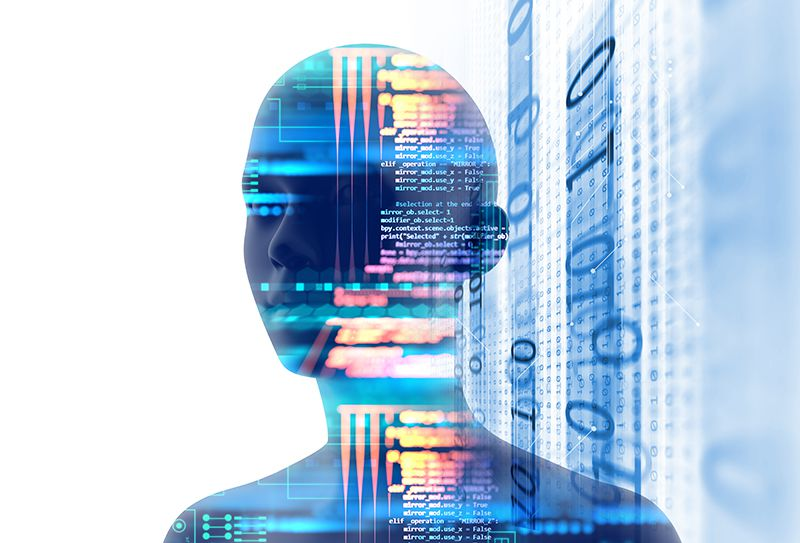

In [45]:
from IPython.display import Image
Image('../Images/artificial-intelligence.jpg')

>**Hello and Welcome to Consumer complaints (Text mining) project.**

>**My name is Ankit and i shall walk you through my code.**

# Table of Contents
1. [Step 1 - Import libraries](#ch1)
1. [Step 2 - Step 1: Read the dataset and Step 2: Read the pdf file](#ch2)
1. [Step 3 -  Check the datatypes](#ch3)
1. [Step 4 - Summary Statistics](#ch4)
1. [Step 5 - Clean data](#ch5)
1. [Step 6 - check the missing values](#ch6)
1. [Step 7 - Impute na values](#ch7)
1. [Step 8 - Visualization](#ch8)
1. [Step 9 - Data Exploration and Feature Engineering](#ch9)
1. [Step 10 - Preprocessing](#ch10)
1. [Step 11 - Clustering](#ch12)

<a id="ch1"></a>
# Import Libraries 

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
#load packages
import sys #access to system parameters https://docs.python.org/3/library/sys.html
print("Python version: {}". format(sys.version))

import pandas as pd #collection of functions for data processing and analysis modeled after R dataframes with SQL like features
print("pandas version: {}". format(pd.__version__))

import matplotlib #collection of functions for scientific and publication-ready visualization
print("matplotlib version: {}". format(matplotlib.__version__))

import numpy as np #foundational package for scientific computing
print("NumPy version: {}". format(np.__version__))

import scipy as sp #collection of functions for scientific computing and advance mathematics
print("SciPy version: {}". format(sp.__version__)) 

import IPython
from IPython import display #pretty printing of dataframes in Jupyter notebook
print("IPython version: {}". format(IPython.__version__)) 

import sklearn #collection of machine learning algorithms
print("scikit-learn version: {}". format(sklearn.__version__))

#misc libraries
import random
import time


#ignore warnings
import warnings
warnings.filterwarnings('ignore')

Python version: 3.6.4 |Anaconda, Inc.| (default, Jan 16 2018, 12:04:33) 
[GCC 4.2.1 Compatible Clang 4.0.1 (tags/RELEASE_401/final)]
pandas version: 0.22.0
matplotlib version: 2.2.2
NumPy version: 1.15.4
SciPy version: 1.0.0
IPython version: 6.2.1
scikit-learn version: 0.20.0


In [2]:
#Visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import seaborn as sns
from pandas.tools.plotting import scatter_matrix
from sklearn.manifold import TSNE

import plotly
print("plotly version ",plotly.__version__)
import plotly.offline as pyoff
import plotly.figure_factory as ff
from plotly.offline import init_notebook_mode, iplot, plot
import plotly.graph_objs as go

#Display Images
from IPython.display import Image

#clsutering libraries
from nltk.cluster import KMeansClusterer
import nltk
from sklearn import metrics

#Pretrained models libraries
import gensim.models as g
import codecs

import re #Regular Expression
from textblob import TextBlob #for text processing

#Doc2Vec libraries
from gensim.test.utils import common_texts
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

#Configure Visualization Defaults
#%matplotlib inline = show plots in Jupyter Notebook browser
%matplotlib inline

init_notebook_mode(connected=True)

plotly version  3.1.1


In [3]:
# Input data files are available in the "../Dataset/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the Dataset directory
from subprocess import check_output
print(check_output(["ls", "../Dataset/"]).decode("utf8"))

GrievancesData_Test.csv
GrievancesData_Train.csv
PHD_Batch44_ProblemStatement_Structure.xlsx
Test.csv
Train.csv
ftca and cch.xlsx
ftca.xlsx



<a id="ch2"></a>

# Step 1: Read the dataset

In [4]:
# We are reading the train data using pd.read_csv
train_data = pd.read_csv("../Dataset/GrievancesData_Train.csv")

In [5]:
#printing the train data
train_data

,GrievanceID,BankID,State,DateOfGrievance,Grievance_Category,GrievanceDescription,LineOfBusiness,ResolutionComments,Disputed,DateOfResolution
0,GID512411,Bank5279,State31,2016-01-19,Settlement process and costs,"Bank5279 Research dpt. \nXXXX XXXX XXXX XXXX,...",Mortgage,Closed with explanation,No,2016-01-30
1,GID512412,Bank5287,State26,2016-01-19,"Application, originator, mortgage broker",I had a mortgage with from XXXX of XXXX to XX...,Mortgage,Closed with explanation,Yes,2016-02-10
2,GID512413,Bank5286,State14,2016-01-19,Billing disputes,"In XXXX XXXX, I was given a {$1100.00} credit...",Credit card,Closed with monetary relief,Yes,2016-02-10
3,GID512415,Bank5279,State53,2016-01-19,"Loan servicing, payments, escrow account",Our Mortgage was sold to Bank5279 in XXXX of ...,Mortgage,Closed with explanation,No,2016-01-30
4,GID512417,Bank5286,State37,2016-01-19,"Loan modification,collection,foreclosure",We started dealing with Citi Mortgage back in...,Mortgage,Closed with explanation,No,2016-01-30
5,GID512418,Bank5237,State16,2016-01-19,Dealing with my lender or servicer,Trouble with how payments are handled My husba...,Student loan,Closed with explanation,No,2016-02-19
6,GID512419,Bank5257,State16,2016-01-19,"Loan modification,collection,foreclosure","TOO BIG TO FAIL AND CARE We are in our XXXX, ...",Mortgage,Closed with explanation,Yes,2016-02-10
7,GID515122,Bank5397,State27,2016-03-19,Managing the loan or lease,I have a car loan with Bank5397. In XXXX of 2...,Consumer Loan,Closed with explanation,No,2016-03-30
8,GID512421,Bank5382,State14,2016-01-19,"Loan servicing, payments, escrow account",Ocwen loan servicing is the servicer of my lo...,Mortgage,Closed with explanation,Yes,2016-02-10
9,GID515125,Bank5422,State39,2016-03-19,"Loan servicing, payments, escrow account",We are trying to close a new Mortgage we have...,Mortgage,Closed with explanation,No,2016-03-30


In [6]:
# We are reading the test data using pd.read_csv
test_data = pd.read_csv("../Dataset/GrievancesData_Test.csv")

In [7]:
#printing the train data
test_data

,GrievanceID,BankID,State,DateOfGrievance,Grievance_Category,GrievanceDescription,LineOfBusiness,ResolutionComments,Disputed,DateOfResolution
0,GID512414,Bank5334,State43,2016-01-19,"Loan servicing, payments, escrow account",I currently have a mortgage with Flag star ba...,Mortgage,Closed with explanation,No,2016-01-30
1,GID512416,Bank5278,State16,2016-01-19,Problems when you are unable to pay,Bank5278 Auto Finance repossessed and subsequ...,Consumer Loan,Closed with explanation,No,2016-02-03
2,GID515121,Bank5372,State56,2016-03-19,"Loan servicing, payments, escrow account",We fell behind in our payments back in 2014 f...,Mortgage,Closed with explanation,No,2016-03-30
3,GID515123,Bank5372,State47,2016-03-19,"Loan servicing, payments, escrow account",My home is on XXXX parcels of land. The first...,Mortgage,Closed with explanation,No,2016-03-30
4,GID515124,Bank5310,State10,2016-03-19,Settlement process and costs,We mortgaged our home with XXXX on XXXX/XXXX/...,Mortgage,Closed with explanation,No,2016-03-30
5,GID512420,Bank5259,State9,2016-01-19,Advertising and marketing,I accepted a credit card off for the Barclays...,Credit card,Closed with explanation,No,2016-01-30
6,GID512426,Bank5278,State40,2016-01-19,Identity theft / Fraud / Embezzlement,"I would like to be credited in full, of all t...",Credit card,Closed with explanation,No,2016-03-11
7,GID512428,Bank5373,State43,2016-01-19,Can't repay my loan,Can't decrease my monthly payments I am trying...,Student loan,Closed with explanation,Yes,2016-02-10
8,GID512429,Bank5284,State14,2016-01-19,"Loan modification,collection,foreclosure",I was charged a fee both when I spoke with XX...,Mortgage,Closed with explanation,Yes,2016-02-10
9,GID512430,Bank5316,State9,2016-01-19,Dealing with my lender or servicer,Having problems with customer service On XXXX ...,Student loan,Closed with explanation,No,2016-02-25


### Reading train data with target column.

In [8]:
# We are reading the data with target column using pd.read_csv
data_train_with_target = pd.read_csv('../Dataset/Train.csv')

In [9]:
# Printing the train data with target column
data_train_with_target.head()

,BankID,BankGrade
0,Bank5298,satisfactory
1,Bank5421,deficient
2,Bank5326,satisfactory
3,Bank5432,outstanding
4,Bank5439,deficient


### Joining the target column in the train data on BankID and join type used in inner

**"train data"** -> contains columns (**GrievanceID, BankID, State, DateOfGrievance, Grievance_Category, GrievanceDescription, LineOfBusiness, ResolutionComments, Disputed, DateOfResolution**)

**"train data with target column"** -> contains columns (**BankID,BankGrade**)

We will be using pd.merge to combine "train data" and "train data with target column" on BankID, the join type will be inner.

In [10]:
# Joining train_data and data_train_with_target using pd.merge on BankID using inner join.
train_data = pd.merge(train_data, data_train_with_target, on='BankID', how='inner')

In [11]:
# we observed that the data is sorted by Bankgrade. So in order to rearrange the data we use .sample(frac=1). Where frac =1 means entire data.
train_data = train_data.sample(frac=1)

# Step 2: Read the pdf file

Reading the pdf file **Federal Trade Commission Act Section 5: Unfair or Deceptive Acts or Practices**

The pdf document can be found in this link: "https://www.federalreserve.gov/boarddocs/supmanual/cch/ftca.pdf"

In order to read the file, I have copied the content in a csv file and i am reading that file.

In [12]:
# I have copied the contents from the "ftca.pdf" file to a "Book_pdf.csv" csv file. And reading the csv file using pd.read_csv
pdf_doc = pd.read_excel('../Dataset/ftca.xlsx')

In [13]:
# Printing the content of the pdf file.
pdf_doc

,Text
0,Federal Trade Commission Act\nSection 5: Unfai...


In [14]:
#Printing the totla number of words in the pdf document
pdf_doc.Text.apply(lambda x: len(x.split()))

0    5027
Name: Text, dtype: int64

In [15]:
# Printing only the text content of the pdf_doc dataframe
print(pdf_doc.Text)

0    Federal Trade Commission Act\nSection 5: Unfai...
Name: Text, dtype: object


# PDF combined doc2vec

While going through the domain i came across a Consumer Compliance Handbook which i have used to build my corpus.

Consumer Compliance Handbook can be found in this link: https://www.federalreserve.gov/boarddocs/supmanual/cch/200711/cch200711.pdf

I have combined ftca.pdf and Consumer Compliance Handbook in an excel file and loaded that file.

In [16]:
# ftca.pdf and Consumer Compliance Handbook combined, copied in excel and read using pd.read_csv.
pdf_doc_combined = pd.read_excel('../Dataset/ftca and cch.xlsx')

<a id="ch3"></a>
# Check the datatypes

In [17]:
#preview data
train_data.info() #https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.info.html
#train_data.head() #https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.head.html
#train_data.tail() #https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.tail.html
train_data.sample(10) #https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.sample.html

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53680 entries, 27513 to 33212
Data columns (total 11 columns):
GrievanceID             53680 non-null object
BankID                  53680 non-null object
State                   53559 non-null object
DateOfGrievance         53680 non-null object
Grievance_Category      53680 non-null object
GrievanceDescription    53680 non-null object
LineOfBusiness          53680 non-null object
ResolutionComments      53680 non-null object
Disputed                53680 non-null object
DateOfResolution        53680 non-null object
BankGrade               53680 non-null object
dtypes: object(11)
memory usage: 4.9+ MB


,GrievanceID,BankID,State,DateOfGrievance,Grievance_Category,GrievanceDescription,LineOfBusiness,ResolutionComments,Disputed,DateOfResolution,BankGrade
44074,GID402125,Bank5390,State40,2013-03-26,"Loan servicing, payments, escrow account",I have a penny mac online user id for my mont...,Mortgage,Closed with explanation,No,2013-04-06,satisfactory
7564,GID431825,Bank5237,State52,2013-09-14,Dealing with my lender or servicer,Received bad information about my loan The com...,Student loan,Closed with explanation,No,2013-10-15,satisfactory
9398,GID356405,Bank5257,NaN,2012-05-31,Other fee,-- Price gauging with foreign transaction fee...,Credit card,Closed with monetary relief,No,2012-06-11,satisfactory
669,GID480805,Bank5279,State52,2014-05-24,Closing on a mortgage,"On XXXX XXXX , 2017 I contacted the comp...",Mortgage,Closed with explanation,No,2014-06-04,outstanding
31165,GID462786,Bank5256,State13,2014-02-16,Identity theft / Fraud / Embezzlement,Fraud charges and temp authorizations on cred...,Credit card,Closed with monetary relief,No,2014-04-03,satisfactory
24539,GID434059,Bank5367,State43,2013-09-25,"Loan modification,collection,foreclosure",M & T Bank attempted to foreclose on my famil...,Mortgage,Closed with non-monetary relief,Yes,2013-10-17,satisfactory
51331,GID366649,Bank5270,State16,2012-08-04,"Loan servicing, payments, escrow account","On XX/XX/2013, I XXXX with the XXXX XXXX to t...",Mortgage,Closed with explanation,No,2012-08-15,outstanding
51339,GID378196,Bank5270,State60,2012-10-19,"Loan servicing, payments, escrow account",This loan has been closed for several years y...,Mortgage,Closed with explanation,Yes,2012-11-10,outstanding
35113,GID399571,Bank5309,State40,2013-03-10,Billing statement,DISCOVER CARD SERVICES HAS BEEN GIVING ME MIS...,Credit card,Closed with explanation,No,2013-03-21,deficient
22734,GID422624,Bank5440,State40,2013-07-27,Credit card protection / Debt protection,While reviewing my Target credit card ( Maste...,Credit card,Closed with explanation,No,2013-08-07,satisfactory


We see that the datatype are proper and no need to change the datatype of the columns

In [18]:
#test data
#preview data
test_data.info() #https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.info.html
#test_data.head() #https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.head.html
#test_data.tail() #https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.tail.html
test_data.sample(10) #https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.sample.html

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27954 entries, 0 to 27953
Data columns (total 10 columns):
GrievanceID             27954 non-null object
BankID                  27954 non-null object
State                   27879 non-null object
DateOfGrievance         27954 non-null object
Grievance_Category      27954 non-null object
GrievanceDescription    27954 non-null object
LineOfBusiness          27954 non-null object
ResolutionComments      27954 non-null object
Disputed                27954 non-null object
DateOfResolution        27954 non-null object
dtypes: object(10)
memory usage: 2.1+ MB


,GrievanceID,BankID,State,DateOfGrievance,Grievance_Category,GrievanceDescription,LineOfBusiness,ResolutionComments,Disputed,DateOfResolution
348,GID347493,Bank5278,State24,2012-04-01,Billing disputes,"This company made me a Video DVD, but never g...",Credit card,Closed with explanation,No,2012-04-12
22959,GID465812,Bank5373,State41,2014-03-05,Dealing with my lender or servicer,Trouble with how payments are handled I was wi...,Student loan,Closed with explanation,No,2014-04-14
1223,GID352435,Bank5373,State43,2012-05-05,Can't repay my loan,Can't get flexible payment options XXXX XXXX n...,Student loan,Closed with explanation,Yes,2012-05-27
13051,GID419212,Bank5310,State35,2013-07-07,"Loan servicing, payments, escrow account","In XXXX of this year, I utilized the Ditech m...",Mortgage,Closed with non-monetary relief,No,2013-07-19
2248,GID357943,Bank5278,State16,2012-06-10,APR or interest rate,I have a Bank5278 Credit Card with a promotio...,Credit card,Closed with explanation,Yes,2012-07-02
1244,GID352564,Bank5424,State30,2012-05-06,"Loan modification,collection,foreclosure","Bank5424 mortgage company is the worst, most ...",Mortgage,Closed with explanation,No,2012-05-17
27922,GID501709,Bank5310,State47,2015-06-26,Struggling to pay mortgage,Ditech will not work with us at all to try to...,Mortgage,Closed with explanation,No,2015-07-07
11063,GID407336,Bank5373,State56,2013-04-27,Dealing with my lender or servicer,Having problems with customer service I have b...,Student loan,Closed with explanation,No,2013-05-28
13774,GID424057,Bank5278,State14,2013-08-03,Managing the loan or lease,I Refinanced my auto loan from 11 % to 3.99 %...,Consumer Loan,Closed with explanation,No,2013-08-14
15,GID515129,Bank5372,State16,2016-03-19,"Loan servicing, payments, escrow account",Bank5372 withheld money from my monthly house...,Mortgage,Closed with explanation,No,2016-03-30


<a id="ch4"></a>
# Summary statistics

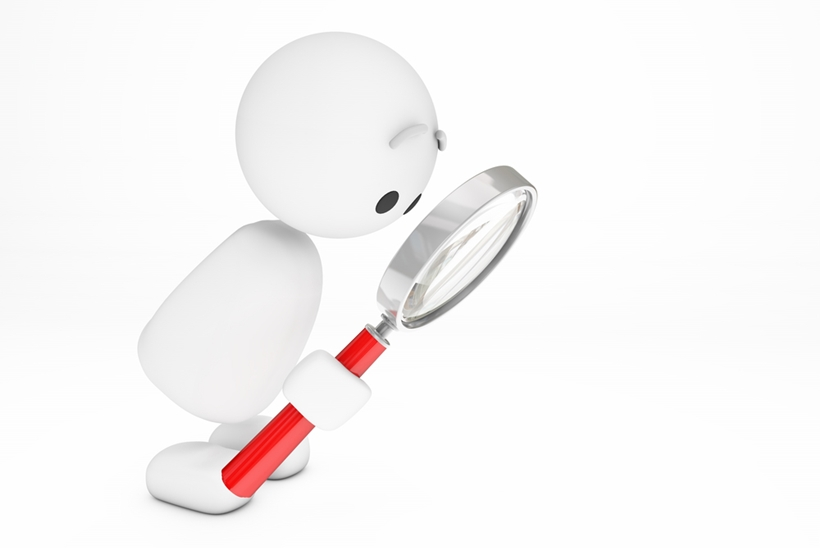

In [46]:
Image('../Images/Summary_statistics.jpg')

In [20]:
train_data.describe(include='all')

,GrievanceID,BankID,State,DateOfGrievance,Grievance_Category,GrievanceDescription,LineOfBusiness,ResolutionComments,Disputed,DateOfResolution,BankGrade
count,53680,53680,53559,53680,53680,53680,53680,53680,53680,53680,53680
unique,53680,86,59,1222,67,46662,4,4,2,1248,3
top,GID417539,Bank5286,State9,2014-01-19,"Loan servicing, payments, escrow account",I was shocked when I reviewed my credit repor...,Credit card,Closed with explanation,No,2013-10-01,satisfactory
freq,1,5623,8110,172,8455,8,21638,41546,41895,142,34881


From the above summary statistics we can infer that:
    
    i) state9 is the top state in the state column and there are 59 states, Additionally this state9 has occured in 8110 of the documents
    
    ii) The most common line of business is *Credit Card* ie. 21638
    
    iii) Most of the grievance are closed with explanation
    
    iv) out of 53680 banks 34881 banks have bank grade satisfied. ie. 64% of the Grievances are satisfied
    
    v) Bank -5286 has occuried in 5623 grievances.

In [21]:
test_data.describe(include='all')

,GrievanceID,BankID,State,DateOfGrievance,Grievance_Category,GrievanceDescription,LineOfBusiness,ResolutionComments,Disputed,DateOfResolution
count,27954,27954,27879,27954,27954,27954,27954,27954,27954,27954
unique,27954,22,61,1168,59,24137,4,4,2,1198
top,GID412926,Bank5373,State9,2014-01-19,"Loan servicing, payments, escrow account",I was shocked when I reviewed my credit repor...,Credit card,Closed with explanation,No,2014-02-19
freq,1,8221,3839,727,4403,6,9561,23505,22524,291


From the above summary statistics we can infer that:
    
    i) state9 is the top state in the state column and there are 61 states, Additionally this state9 has occured in 3839 of the documents
    
    ii) The most common line of business is *Credit Card* ie. 9561
    
    iii) Most of the grievance are closed with explanation
        
    iv) Bank -5373 has occuried in 8221 grievances.

#### Total number of Columns and Records

In [22]:
print("No. of Columns = {}".format(len(train_data.columns)))

print('No. of Records = \n{}'.format(train_data.count()))

No. of Columns = 11
No. of Records = 
GrievanceID             53680
BankID                  53680
State                   53559
DateOfGrievance         53680
Grievance_Category      53680
GrievanceDescription    53680
LineOfBusiness          53680
ResolutionComments      53680
Disputed                53680
DateOfResolution        53680
BankGrade               53680
dtype: int64


In [23]:
print("No. of Columns = {}".format(len(test_data.columns)))

print('No. of Records = \n{}'.format(test_data.count()))

No. of Columns = 10
No. of Records = 
GrievanceID             27954
BankID                  27954
State                   27879
DateOfGrievance         27954
Grievance_Category      27954
GrievanceDescription    27954
LineOfBusiness          27954
ResolutionComments      27954
Disputed                27954
DateOfResolution        27954
dtype: int64


<a id="ch5"></a>
# 3 Clean Data

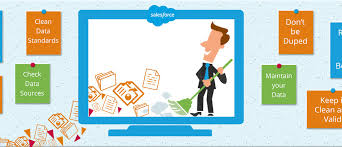

In [47]:
Image('../Images/Clean data.jpeg')

Now that we know what to clean, let's execute our code.

** Developer Documentation: **
* [pandas.DataFrame](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.html)
* [pandas.DataFrame.info](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.info.html)
* [pandas.DataFrame.describe](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.describe.html)
* [Indexing and Selecting Data](https://pandas.pydata.org/pandas-docs/stable/indexing.html)
* [pandas.isnull](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.isnull.html)
* [pandas.DataFrame.sum](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.sum.html)
* [pandas.DataFrame.mode](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.mode.html)
* [pandas.DataFrame.copy](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.copy.html)
* [pandas.DataFrame.fillna](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.fillna.html)
* [pandas.DataFrame.drop](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.drop.html)
* [pandas.Series.value_counts](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.Series.value_counts.html)
* [pandas.DataFrame.loc](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.loc.html)

<a id="ch6"></a>
# Check the missing values

In [25]:
# using  isna().sum() we are getting the total number of na values in each columns.
train_data.isna().sum()

GrievanceID               0
BankID                    0
State                   121
DateOfGrievance           0
Grievance_Category        0
GrievanceDescription      0
LineOfBusiness            0
ResolutionComments        0
Disputed                  0
DateOfResolution          0
BankGrade                 0
dtype: int64

#### There are 121 na values and all those values are in state column

In [26]:
# using  isna().sum() we are getting the total number of na values in each columns.
test_data.isna().sum()

GrievanceID              0
BankID                   0
State                   75
DateOfGrievance          0
Grievance_Category       0
GrievanceDescription     0
LineOfBusiness           0
ResolutionComments       0
Disputed                 0
DateOfResolution         0
dtype: int64

#### There are 75 na values and all those values are in state column

In [27]:
# printing the rows and columns that contain na values
train_data[train_data['State'].isnull()]

,GrievanceID,BankID,State,DateOfGrievance,Grievance_Category,GrievanceDescription,LineOfBusiness,ResolutionComments,Disputed,DateOfResolution,BankGrade
6236,GID465585,Bank5286,NaN,2014-03-03,Billing statement,I have a pending 1 month credit bills on Bank...,Credit card,Closed with explanation,No,2014-03-18,satisfactory
14851,GID488830,Bank5397,NaN,2014-07-13,Struggling to pay mortgage,XXXX XXXX XXXX My name is XXXX XXXX. I was in...,Mortgage,Closed with explanation,No,2014-07-24,satisfactory
22568,GID402556,Bank5440,NaN,2013-03-29,Privacy,"On XXXX/XXXX/2016 at XXXX XXXX at the XXXX, V...",Credit card,Closed with non-monetary relief,Yes,2013-04-20,satisfactory
12987,GID449447,Bank5257,NaN,2013-12-22,Billing disputes,"In short, I believe XXXX ( or more ) "" XXXX C...",Credit card,Closed with monetary relief,Yes,2014-01-13,satisfactory
45242,GID495948,Bank5414,NaN,2014-10-18,Problem with a credit reporting company's inve...,Roundpoint mortgage company sold my loan to X...,Mortgage,Closed with explanation,No,2014-11-18,outstanding
26778,GID404404,Bank5285,NaN,2013-04-09,Delinquent account,"Today, XXXX XXXX, I was contacted by Bank5285...",Credit card,Closed with monetary relief,No,2013-04-20,deficient
29969,GID356423,Bank5256,NaN,2012-05-31,Other fee,-- Price gauging with foreign transaction fee...,Credit card,Closed with monetary relief,No,2012-06-11,satisfactory
52304,GID446733,Bank5378,NaN,2013-12-07,Dealing with my lender or servicer,Having problems with customer service My stude...,Student loan,Closed with explanation,No,2014-01-08,satisfactory
17727,GID443095,Bank5382,NaN,2013-11-14,"Loan modification,collection,foreclosure",I have a Town Home in Hawaii and my ex-husban...,Mortgage,Closed with explanation,No,2013-11-26,satisfactory
26069,GID383403,Bank5285,NaN,2012-11-19,Credit card protection / Debt protection,I disputed a charge made on my account by a c...,Credit card,Closed with monetary relief,No,2012-11-30,deficient


In [28]:
# printing the rows and columns that contain na values
test_data[test_data['State'].isnull()]

,GrievanceID,BankID,State,DateOfGrievance,Grievance_Category,GrievanceDescription,LineOfBusiness,ResolutionComments,Disputed,DateOfResolution
1179,GID352207,Bank5372,NaN,2012-05-04,"Loan modification,collection,foreclosure",My mother died in XXXX of last year XXXX. She...,Mortgage,Closed with explanation,Yes,2012-05-26
3440,GID364603,Bank5271,NaN,2012-07-22,Managing the loan or lease,My XXXX XXXX was totaled in an accident on XX...,Consumer Loan,Closed with explanation,No,2012-08-02
3494,GID364909,Bank5278,NaN,2012-07-23,Identity theft / Fraud / Embezzlement,I now live in XXXX XXXX and my CapitalOne Vis...,Credit card,Closed with monetary relief,No,2012-09-07
4554,GID370572,Bank5437,NaN,2012-08-28,Identity theft / Fraud / Embezzlement,This is the XXXX time I 've had to submit a c...,Credit card,Closed with explanation,No,2012-10-13
4568,GID370631,Bank5437,NaN,2012-08-28,Identity theft / Fraud / Embezzlement,This is the XXXX time I 've had to submit a c...,Credit card,Closed with explanation,No,2012-10-13
4677,GID371238,Bank5246,NaN,2012-09-02,Other,My only American express account number is XX...,Credit card,Closed with non-monetary relief,No,2012-09-19
6041,GID379354,Bank5437,NaN,2012-10-25,Identity theft / Fraud / Embezzlement,"Dear Sir, Today I received a mail notificatio...",Credit card,Closed with explanation,No,2012-12-13
6059,GID379422,Bank5437,NaN,2012-10-25,Identity theft / Fraud / Embezzlement,"Dear Sir, Today I received a mail notificatio...",Credit card,Closed with explanation,No,2012-12-13
7232,GID386321,Bank5424,NaN,2012-12-12,"Loan modification,collection,foreclosure",We have submitted the application through my ...,Mortgage,Closed with explanation,Yes,2013-01-07
7242,GID386355,Bank5310,NaN,2012-12-12,"Loan servicing, payments, escrow account",I have an urgent problem with the servicing o...,Mortgage,Closed with explanation,Yes,2013-01-08


<a id="ch7"></a>
# Impute  na values

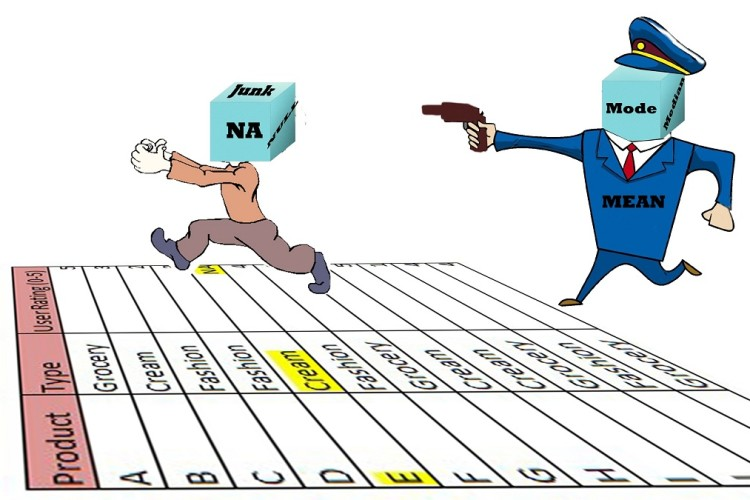

In [48]:
Image('../Images/Missing-Value-imputation.jpg')

#### Impute  na values for train data

With the help of describe() function we have found out the most common value in state column is state9, with a frequency of 8110.

We will replace the na values with the state9.

In [30]:
# describe() function will give a brief description of the state column.
train_data['State'].describe()

count      53559
unique        59
top       State9
freq        8110
Name: State, dtype: object

In [31]:
# We are defining a function fillna which will fill the na value in a particular column with the max value in that column
def fillna(col):
    col.fillna(col.value_counts().index[0], inplace=True) # here col.value_counts() will give the value_counts of each category of that categorical column,
    # In our scenario state column is taken, value_counts of each state are printed in the decsending order.
    # with the help of .index[0] we are taking the value that has the occured maximum number of times.
    #And replacing na value with that maximum value in that column.
    return col #returning that column.
train_data = train_data.apply(lambda col:fillna(col)) # With the help of appl function we are filling na values using fillna function.

In [32]:
# Verifying if there are any na values.
train_data['State'].isna().sum()

0

In [33]:
# We will use the below command to see the na value ahs been filled with state9 or not.
# The grievance ID has been taken from the step where we are "printing the rows and columns that contain na values" (refer above).
train_data[['GrievanceID', 'State']][train_data.GrievanceID == 'GID514212']
# we see that the na value has been filled with state 9.

,GrievanceID,State
1176,GID514212,State9


#### Impute  na values for test data

With the help of describe() function we have found out the most common value in state column is state9, with a frequency of 3839.

We will replace the na values with the state9.

In [34]:
# describe() function will give a brief description of the state column.
test_data['State'].describe()

count      27879
unique        61
top       State9
freq        3839
Name: State, dtype: object

In [35]:
# With the help of appl function we are filling na values using fillna function.
test_data = test_data.apply(lambda col:fillna(col))

In [36]:
# Verifying if there are any na values.
test_data['State'].isna().sum()

0

In [37]:
# We will use the below command to see the na value ahs been filled with state9 or not.
# The grievance ID has been taken from the step where we are "printing the rows and columns that contain na values" (refer above).
test_data[['GrievanceID', 'State']][test_data.GrievanceID == 'GID352207']
# we see that the na value has been filled with state 9.

,GrievanceID,State
1179,GID352207,State9


<a id="ch8"></a>
# Visulaization

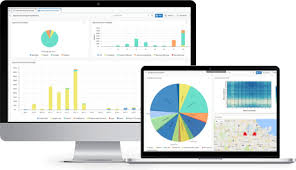

In [49]:
Image('../Images/Visualization.jpeg')

In [39]:
def generate_layout_bar(col_name):
    layout_bar = go.Layout(
        autosize=False, # auto size the graph? use False if you are specifying the height and width
        width=800, # height of the figure in pixels
        height=600, # height of the figure in pixels
        orientation=180,
        title = "Distribution of {} column".format(col_name), # title of the figure
        # more granular control on the title font 
        titlefont=dict( 
            family='Courier New, monospace', # font family
            size=14, # size of the font
            color='black' # color of the font
        ),
        # granular control on the axes objects 
        xaxis=dict( 
        tickfont=dict(
            family='Courier New, monospace', # font family
            size=14, # size of ticks displayed on the x axis
            color='black'  # color of the font
            )
        ),
        yaxis=dict(
#         range=[0,100],
            title='Percentage',
            titlefont=dict(
                size=14,
                color='black'
            ),
        tickfont=dict(
            family='Courier New, monospace', # font family
            size=14, # size of ticks displayed on the y axis
            color='black' # color of the font
            )
        ),
        font = dict(
            family='Courier New, monospace', # font family
            color = "white",# color of the font
            size = 12 # size of the font displayed on the bar
                )  
        )
    return layout_bar

###  We will save the above layout in an object and define a function for future use

In [40]:
def plot_bar(data,col_name):
    # create a table with value counts
    temp = data[col_name].value_counts()
    # creating a Bar chart object of plotly
    data = [go.Bar(
            x=temp.index.astype(str), # x axis values
            y=np.round(temp.values.astype(float)/temp.values.sum(),4)*100, # y axis values
            text = ['{}%'.format(i) for i in np.round(temp.values.astype(float)/temp.values.sum(),4)*100],
        # text to be displayed on the bar, we are doing this to display the '%' symbol along with the number on the bar
            textposition = 'auto', # specify at which position on the bar the text should appear
        marker = dict(color = ' #FFCC00'),)] # change color of the bar
    # color used here orange yellow tangerine
     
    layout_bar = generate_layout_bar(col_name=col_name)

    fig = go.Figure(data=data, layout=layout_bar)
    return iplot(fig)

In [41]:
plot_bar(train_data,'BankGrade') # using the above plotbar function we are plotting the percentage count of values in BankGrade column.

From the above graph we observe that 64.98% of the banks fall under the category of Satisfactory.

26.6% fall under Deficient and 

8.37% fall under outstanding

In [42]:
plot_bar(train_data,'Grievance_Category')# using the above plotbar function we are plotting the percentage count of values in Grievance_Category column.

The above graph is for the grievance categories. The above graph can be used to drop few categories by selecting a threshold value

In [43]:
#It show the distribution of data in different classes of lineofbusiness column

plot_bar(train_data,'LineOfBusiness')# using the above plotbar function we are plotting the percentage count of values in LineOfBusiness column.

From the above graph, we observe that credit card is the major line or business and student loan is the  least line of business.
This means major of the grievances were for credit card loan or credit card faulty or some issue realted to the credit card.
Credit card is an important part of our data.

In [44]:
plot_bar(train_data,'ResolutionComments')# using the above plotbar function we are plotting the percentage count of values in ResolutionComments column.

We observe that 77.4% of the Grievances were closed with explainaition. This shows that an explaination was provided while closing and can help in classifiying bank as staisfactory or outstanding

In [41]:
# Distribution of the Disputed class.

plot_bar(train_data,'Disputed') # using the above plotbar function we are plotting the percentage count of values in Disputed column.

We see that 78.05% of the grievances fall under disputed no category and 21% fall under disputed yes

From my understanding, disputed yes would mean the customer is statisfied with the bank's response to his grievance.

And Disputed no would mean that the customer is not satisfied with the bank's response.

In [42]:
data = []
for i in np.sort(train_data.ResolutionComments.unique()):
        data.append(go.Box(y = train_data.State[train_data.ResolutionComments==i][train_data.Disputed=='Yes'],
                           marker = dict(color = '#CC0E1D', # red),
                                        ),
                                         name = "{}- Yes".format(str(i)))
                   )
        
        data.append(go.Box(y = train_data.State[train_data.ResolutionComments==i][train_data.Disputed=='No'],
                           marker = dict(color = '#588061', # green),
                                        ),
                                         name = "{}- No".format(str(i)))
                   )

layout = go.Layout(
    autosize=False, # auto size the graph? use False if you are specifying the height and width
    width=1000, # height of the figure in pixels
    height=600, # height of the figure in pixels
    title = "Boxplot of {} column based on {} and {} ".format('State','Resolution comments','disputed status'), # title of the figure
    # more granular control on the title font 
    titlefont=dict( 
        family='Courier New, monospace', # font family
        size=14, # size of the font
        color='black' # color of the font
    ),
    # granular control on the axes objects 
    xaxis=dict( 
        title='How banks defer in different states based on resoulution of comments and disputed status',
    tickfont=dict(
        family='Courier New, monospace', # font family
        size=10, # size of ticks displayed on the x axis
        color='black'  # color of the font
        )
    ),
    yaxis=dict(
#         range=[0,100],
    title='States',
    titlefont=dict(
        size=14,
        color='black'
        ),
    tickfont=dict(
        family='Courier New, monospace', # font family
        size=14, # size of ticks displayed on the y axis
        color='black' # color of the font
    )
    ),
    )
fig = go.Figure(data=data, layout=layout)
iplot(fig)        

Outliers in the above plot would mean that these states act as outliers in their respective categories.

For example: State1 acts as a outlier because it varies from other states when it comes to resolution comment: closed with explanation and disputed yes/no.

We can see that few states differ differently when it comes to resolution comments provied for these states.

From the above plot we can infer that how these states differ for different resolution comments and disputed category.

In [43]:
data = []
for i in np.sort(train_data.LineOfBusiness.unique()):
        data.append(go.Box(y = train_data.BankID[train_data.LineOfBusiness==i][train_data.Disputed=='Yes'],
                           marker = dict(
        color = '#CC0E1D',
    ),
                           name = "{}- Yes".format(str(i))))
        data.append(go.Box(y = train_data.BankID[train_data.LineOfBusiness==i][train_data.Disputed=='No'],
                           marker = dict(
        color = '#588061',
    ),
                           name = "{}- No".format(str(i))))

layout = go.Layout(
autosize=False, # auto size the graph? use False if you are specifying the height and width
width=1000, # height of the figure in pixels
height=600, # height of the figure in pixels
title = "Boxplot of {} column based on {} and {} ".format('BankID','LineOfBusiness','Disputed status'), # title of the figure
# more granular control on the title font 
    titlefont=dict( 
        family='Courier New, monospace', # font family
        size=14, # size of the font
        color='black' # color of the font
    ),
    # granular control on the axes objects 
    xaxis=dict( 
        title='Banks and their lineofbusiness and disputed status',
    tickfont=dict(
        family='Courier New, monospace', # font family
        size=10, # size of ticks displayed on the x axis
        color='black'  # color of the font
    )
),
yaxis=dict(
#         range=[0,100],
    title='BankID',
    titlefont=dict(
        size=14,
        color='black'
    ),
    tickfont=dict(
        family='Courier New, monospace', # font family
        size=14, # size of ticks displayed on the y axis
        color='black' # color of the font
    )
),
)
fig = go.Figure(data=data, layout=layout)
iplot(fig)        

Outliers in the above plot would mean that these banks act as outliers in their respective categories.

For example: Bank5341 acts as a outlier because it varies from other banks when it comes to Line of business: Student loan and disputed yes/no.

We can see that few banks differ differently when it comes to line of business provied for these banks.

From the above plot we can infer that how these banks differ for different line of business and disputed category.

#### Checking the number of unique values in each column

In [44]:
for i in train_data.columns:
    print ("Number of unique values in {} column are {} \n The unique values are {}".format(i, len(train_data[i].unique()),train_data[i].unique()))
    print ("---------------------- \n")

Number of unique values in GrievanceID column are 53680 
 The unique values are ['GID492857' 'GID400315' 'GID418894' ... 'GID394435' 'GID484262'
 'GID418768']
---------------------- 

Number of unique values in BankID column are 86 
 The unique values are ['Bank5359' 'Bank5446' 'Bank5382' 'Bank5237' 'Bank5257' 'Bank5242'
 'Bank5421' 'Bank5274' 'Bank5285' 'Bank5309' 'Bank5256' 'Bank5436'
 'Bank5348' 'Bank5277' 'Bank5397' 'Bank5308' 'Bank5328' 'Bank5286'
 'Bank5367' 'Bank5454' 'Bank5422' 'Bank5375' 'Bank5449' 'Bank5249'
 'Bank5261' 'Bank5386' 'Bank5448' 'Bank5451' 'Bank5380' 'Bank5438'
 'Bank5383' 'Bank5440' 'Bank5260' 'Bank5341' 'Bank5346' 'Bank5239'
 'Bank5425' 'Bank5387' 'Bank5418' 'Bank5459' 'Bank5265' 'Bank5356'
 'Bank5423' 'Bank5410' 'Bank5428' 'Bank5432' 'Bank5378' 'Bank5455'
 'Bank5313' 'Bank5390' 'Bank5287' 'Bank5415' 'Bank5298' 'Bank5279'
 'Bank5414' 'Bank5338' 'Bank5453' 'Bank5303' 'Bank5326' 'Bank5364'
 'Bank5296' 'Bank5251' 'Bank5336' 'Bank5247' 'Bank5245' 'Bank5388'
 'Bank5

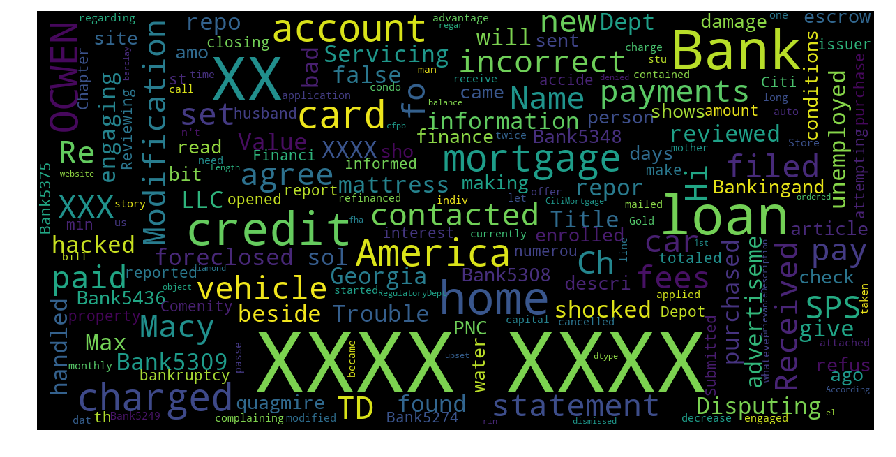

In [45]:
from wordcloud import WordCloud

mpl.rcParams['font.size']=12     # font size            
mpl.rcParams['savefig.dpi']=100          
mpl.rcParams['figure.subplot.bottom']=.1 


def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='black', # background color is set to black
        max_words=300, # maximum number of words
        max_font_size=40, # maximum font size is 40
        scale=3,
        random_state=1 # chosen at random by flipping a coin; it was heads
        
    ).generate(str(data))
    
    fig = plt.figure(1, figsize=(15, 15))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()
    
show_wordcloud(train_data["GrievanceDescription"])
# Wordcloud for Grievance Description

The above word cloud helps in identifying the most common words that occured in the grievances description and we observe words like "Bank5279", "XXXX", "XX" have occured more frequently and these can be appended to the stopwords and removed.

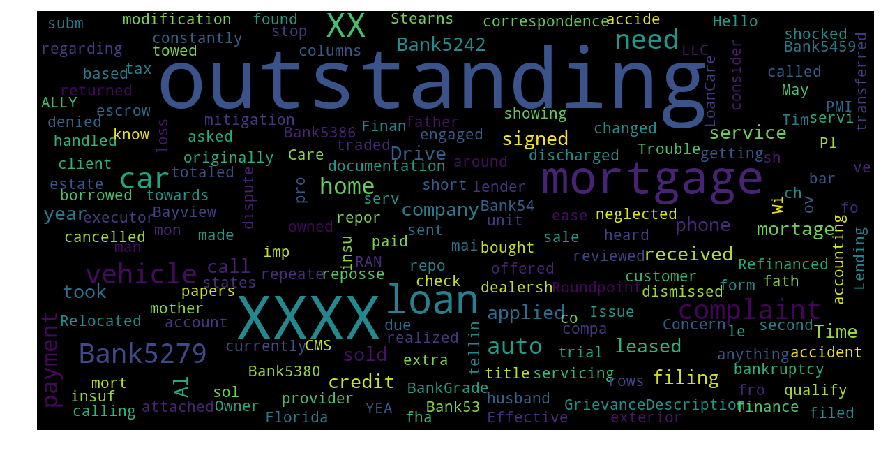

In [46]:
from wordcloud import WordCloud

mpl.rcParams['font.size']=12                #10 
mpl.rcParams['savefig.dpi']=100             #72 
mpl.rcParams['figure.subplot.bottom']=.1 


def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='black',
        max_words=300,
        max_font_size=40, 
        scale=3,
        random_state=1 # chosen at random by flipping a coin; it was heads
        
    ).generate(str(data))
    
    fig = plt.figure(1, figsize=(15, 15))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()
    
show_wordcloud(train_data[["GrievanceDescription","BankGrade"]][train_data.BankGrade=='outstanding'])
# Wordcloud for Grievance Description where BankGrade = outstanding

These are the common words for the banks and grievances which have performed outstanding.
mortgage, bank,XX XX, XXXX, loan and few other words can be removed in the preprocessing.

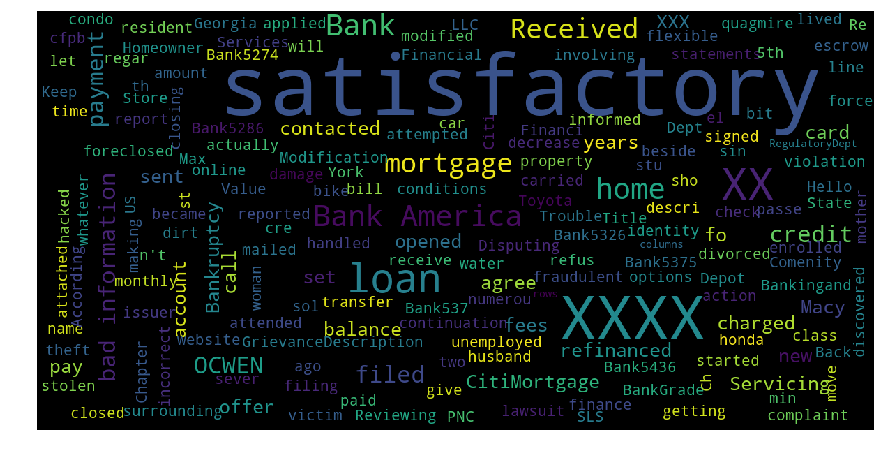

In [47]:
from wordcloud import WordCloud

mpl.rcParams['font.size']=12                #10 
mpl.rcParams['savefig.dpi']=100             #72 
mpl.rcParams['figure.subplot.bottom']=.1 


def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='black',
        max_words=300,
        max_font_size=40, 
        scale=3,
        random_state=1 # chosen at random by flipping a coin; it was heads
        
    ).generate(str(data))
    
    fig = plt.figure(1, figsize=(15, 15))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()
    
show_wordcloud(train_data[["GrievanceDescription","BankGrade"]][train_data.BankGrade=='satisfactory'])
# Wordcloud for Grievance Description where BankGrade = satisfactory

These are the common words for the banks and grievances which have performed Satisfactory.
credit card, bank5286,XX, XXXX, loan and few other words can be removed in the preprocessing.

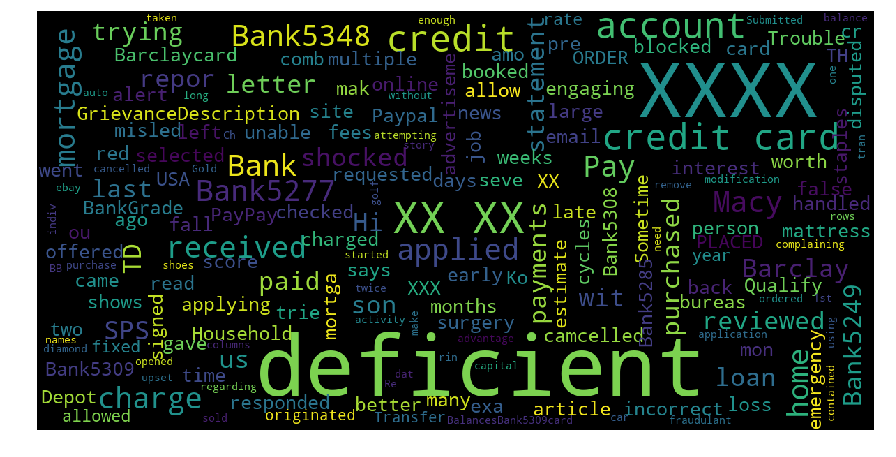

In [48]:
from wordcloud import WordCloud

mpl.rcParams['font.size']=12                #10 
mpl.rcParams['savefig.dpi']=100             #72 
mpl.rcParams['figure.subplot.bottom']=.1 


def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='black',
        max_words=300,
        max_font_size=40, 
        scale=3,
        random_state=1 # chosen at random by flipping a coin; it was heads
        
    ).generate(str(data))
    
    fig = plt.figure(1, figsize=(15, 15))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()
    
show_wordcloud(train_data[["GrievanceDescription","BankGrade"]][train_data.BankGrade=='deficient'])
# Wordcloud for Grievance Description where BankGrade = deficient

These are the common words for the banks and grievances which have performed deficient.
mortgage, bank,XXXX,citizens, hacked and few other words can be removed in the preprocessing.

We observed that these words **mortgage, bank,XXXX,citizens, hacked**  and few other that are most common in the above categories. So these words can be removed while preprocessing

## Visualizations on test data

In [49]:
plot_bar(test_data,'Grievance_Category') # using the above plotbar function we are plotting the percentage count of values in Grievance_Category column.

The above graph is for the grievance categories. The above graph can be used to drop few categories by selecting a threshold value

In [50]:
#It show the distribution of data in different classes of lineofbusiness column

plot_bar(test_data,'LineOfBusiness') # using the above plotbar function we are plotting the percentage count of values in LineOfBusiness column.

From the above graph, we observe that credit card is the major line or business and consumer loan is the  least line of business.
This means major of the grievances were for credit card loan or credit card faulty or some issur realted to the credit card.
Credit card is an important part of our data.

Also, in train data student loan was the least line of business but in test data consumer loan is the least line of business.

In [51]:
plot_bar(test_data,'ResolutionComments') # using the above plotbar function we are plotting the percentage count of values in ResolutionComments column.

We observe that 84.08% of the Grievances were closed with explainaition. This shows that an explaination was provided while closing and can help in classifiying bank as staisfactory or outstanding

In [52]:
# Distribution of the Disputed class.

plot_bar(test_data,'Disputed') # using the above plotbar function we are plotting the percentage count of values in Disputed column.

We see that 80.58% of the grievances fall under disputed no category and 19.42% fall under disputed yes

From my understanding, disputed yes would mean the customer is statisfied with the bank's response to his grievance.

And Disputed no would mean that the customer is not satisfied with the bank's response.

In [53]:
data = []
for i in np.sort(test_data.ResolutionComments.unique()):
        data.append(go.Box(y = test_data.State[test_data.ResolutionComments==i][test_data.Disputed=='Yes'],
                           marker = dict(color = '#CC0E1D', # red),
                                        ),
                                         name = "{}- Yes".format(str(i)))
                   )
        
        data.append(go.Box(y = test_data.State[test_data.ResolutionComments==i][test_data.Disputed=='No'],
                           marker = dict(color = '#588061', # green),
                                        ),
                                         name = "{}- No".format(str(i)))
                   )

layout = go.Layout(
    autosize=False, # auto size the graph? use False if you are specifying the height and width
    width=1000, # height of the figure in pixels
    height=600, # height of the figure in pixels
    title = "Boxplot of {} column based on {} and {}".format('State','Resolution comments','disputed status'), # title of the figure
    # more granular control on the title font 
    titlefont=dict( 
        family='Courier New, monospace', # font family
        size=14, # size of the font
        color='black' # color of the font
    ),
    # granular control on the axes objects 
    xaxis=dict( 
    tickfont=dict(
        family='Courier New, monospace', # font family
        size=10, # size of ticks displayed on the x axis
        color='black'  # color of the font
        )
    ),
    yaxis=dict(
#         range=[0,100],
    title='States',
    titlefont=dict(
        size=14,
        color='black'
        ),
    tickfont=dict(
        family='Courier New, monospace', # font family
        size=14, # size of ticks displayed on the y axis
        color='black' # color of the font
    )
    ),
    )
fig = go.Figure(data=data, layout=layout)
iplot(fig)        

Outliers in the above plot would mean that these states act as outliers in their respective categories.

For example: State7 acts as a outlier because it varies from other states when it comes to resolution comment: closed with explanation and disputed yes/no.

We can see that few states differ differently when it comes to resolution comments provied for these states.

From the above plot we can infer that how these states differ for different resolution comments and disputed category.

In [54]:
data = []
for i in np.sort(test_data.LineOfBusiness.unique()):
        data.append(go.Box(y = test_data.BankID[test_data.LineOfBusiness==i][test_data.Disputed=='Yes'],
                           marker = dict(
        color = '#CC0E1D',
    ),
                           name = "{}- Yes".format(str(i))))
        data.append(go.Box(y = test_data.BankID[test_data.LineOfBusiness==i][test_data.Disputed=='No'],
                           marker = dict(
        color = '#588061',
    ),
                           name = "{}- No".format(str(i))))

layout = go.Layout(
autosize=False, # auto size the graph? use False if you are specifying the height and width
width=1000, # height of the figure in pixels
height=600, # height of the figure in pixels
title = "Boxplot of {} column based on {} and {} ".format('BankID','LineOfBusiness','Disputed status'), # title of the figure
# more granular control on the title font 
    titlefont=dict( 
        family='Courier New, monospace', # font family
        size=14, # size of the font
        color='black' # color of the font
    ),
    # granular control on the axes objects 
    xaxis=dict( 
        title='Number of companies worked and attrition',
    tickfont=dict(
        family='Courier New, monospace', # font family
        size=10, # size of ticks displayed on the x axis
        color='black'  # color of the font
    )
),
yaxis=dict(
#         range=[0,100],
    title='BankID',
    titlefont=dict(
        size=14,
        color='black'
    ),
    tickfont=dict(
        family='Courier New, monospace', # font family
        size=14, # size of ticks displayed on the y axis
        color='black' # color of the font
    )
),
)
fig = go.Figure(data=data, layout=layout)
iplot(fig)        

Outliers in the above plot would mean that these banks act as outliers in their respective categories.

For example: Bank5316 acts as a outlier because it varies from other banks when it comes to Line of business: Student loan, consumer loan and  credit card and disputed yes/no.

We can see that few banks differ differently when it comes to line of business provied for these banks.

From the above plot we can infer that how these banks differ for different line of business and disputed category.

#### Checking the number of unique values in each column

In [55]:
for i in test_data.columns:
    print ("Number of unique values in {} column are {} \n The unique values are {}".format(i, len(test_data[i].unique()),test_data[i].unique()))
    print ("---------------------- \n")

Number of unique values in GrievanceID column are 27954 
 The unique values are ['GID512414' 'GID512416' 'GID515121' ... 'GID502084' 'GID502140'
 'GID502376']
---------------------- 

Number of unique values in BankID column are 22 
 The unique values are ['Bank5334' 'Bank5278' 'Bank5372' 'Bank5310' 'Bank5259' 'Bank5373'
 'Bank5284' 'Bank5316' 'Bank5424' 'Bank5437' 'Bank5246' 'Bank5312'
 'Bank5318' 'Bank5393' 'Bank5403' 'Bank5416' 'Bank5374' 'Bank5299'
 'Bank5272' 'Bank5271' 'Bank5322' 'Bank5391']
---------------------- 

Number of unique values in State column are 61 
 The unique values are ['State43' 'State16' 'State56' 'State47' 'State10' 'State9' 'State40'
 'State14' 'State46' 'State30' 'State53' 'State23' 'State4' 'State59'
 'State27' 'State26' 'State8' 'State44' 'State21' 'State38' 'State35'
 'State36' 'State31' 'State22' 'State24' 'State5' 'State55' 'State28'
 'State60' 'State49' 'State32' 'State18' 'State25' 'State19' 'State11'
 'State61' 'State45' 'State13' 'State52' 'State2' 

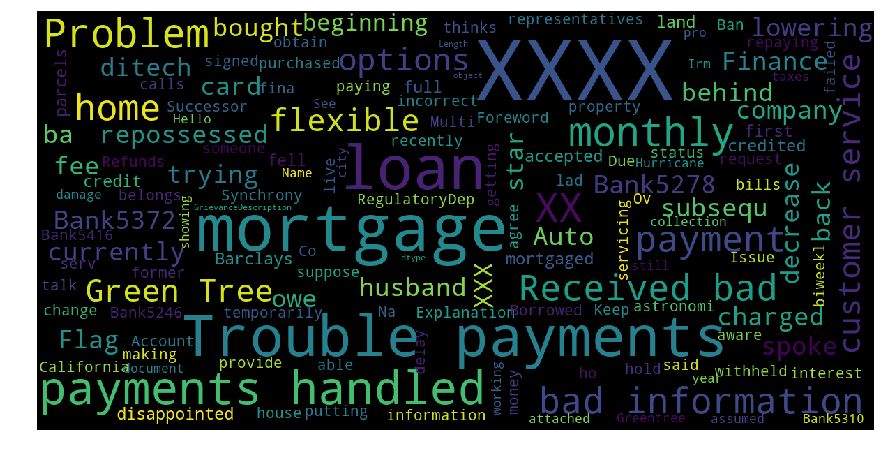

In [56]:
from wordcloud import WordCloud

mpl.rcParams['font.size']=12                #10 
mpl.rcParams['savefig.dpi']=100             #72 
mpl.rcParams['figure.subplot.bottom']=.1 


def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='black',
        max_words=300,
        max_font_size=40, 
        scale=3,
        random_state=1 # chosen at random by flipping a coin; it was heads
        
    ).generate(str(data))
    
    fig = plt.figure(1, figsize=(15, 15))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()
    
show_wordcloud(test_data["GrievanceDescription"])

The above word cloud helps in identifying the most common words that occured in the grievances description and we observe words like "XXXX", "XX" , "mortgage" have occured more frequently and these can be added to the stopwords and removed.

<a id="ch9"></a>
# Data Exploration and Feature Engineering

We shall find the difference between the date of grievance and date of resolution as number of days taken to resolve the grievance of the customer.

In [57]:
# converting into appropriate format
train_data["DateOfGrievance"] = pd.to_datetime(train_data["DateOfGrievance"], format="%Y/%m/%d")
train_data["DateOfResolution"] = pd.to_datetime(train_data["DateOfResolution"], format="%Y/%m/%d")

# Taking a difference between the dateofresolution and dateofGrievance to get an intuition of how many days it took to close the grievance.
train_data["DAYSDIFF"] = train_data["DateOfResolution"] - train_data["DateOfGrievance"]

In [58]:
# converting the DAYSDIFF datatype to timedelta64[D] which is time date format
train_data.DAYSDIFF = train_data.DAYSDIFF.astype('timedelta64[D]')

In [59]:
#Checking the datatypes of train data
train_data.dtypes

GrievanceID                     object
BankID                          object
State                           object
DateOfGrievance         datetime64[ns]
Grievance_Category              object
GrievanceDescription            object
LineOfBusiness                  object
ResolutionComments              object
Disputed                        object
DateOfResolution        datetime64[ns]
BankGrade                       object
DAYSDIFF                       float64
dtype: object

In [60]:
#Checking the datatypes of train data
train_data.DAYSDIFF.describe()

count    53680.000000
mean        17.321777
std         11.238083
min          1.000000
25%         11.000000
50%         11.000000
75%         22.000000
max        629.000000
Name: DAYSDIFF, dtype: float64

##### From above we can see that on averages the cases were resolved within 18 days. Which can be used as a threshold parameter.

Also, we can infer if the banks closed the grievance before 17 (mean) days, the performance of the bak would be satisfactory or outstanding.

If the bank is taking more days to close a grievance then it is directly affecting on the performance of the bank.

##### Refer the plots below.

### Note:
The below graphs are screenshot represenation because the code of the below two graphs was causing a lot of lag in the entire code.

Additionally these 2 graphs have been attached in the ipynb file following the naming convention [Ankit_Jain_b44_PHD_Visualization_and_preprocessing_two_more_plots_11232018.ipynb] (Please refer)

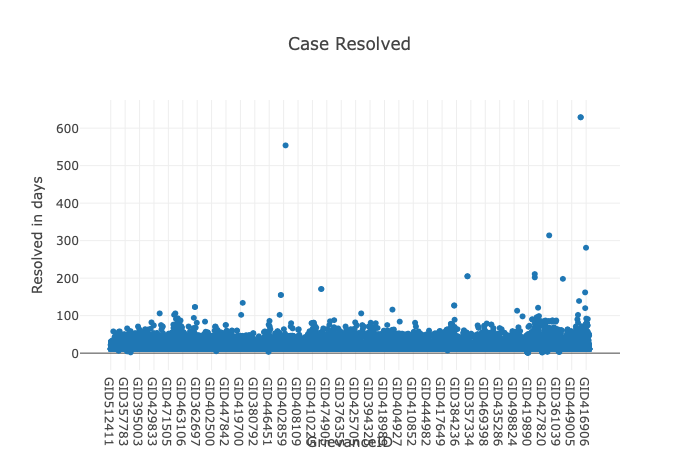

In [50]:
Image('../Images/Scatter plot.jpg')

We can see the Grievances closed within 100 days are more and above 100 are less.

The cases taht are are taking more time to close can be considered as outliers.

They can either be ignored or considered to know the reason for delay.

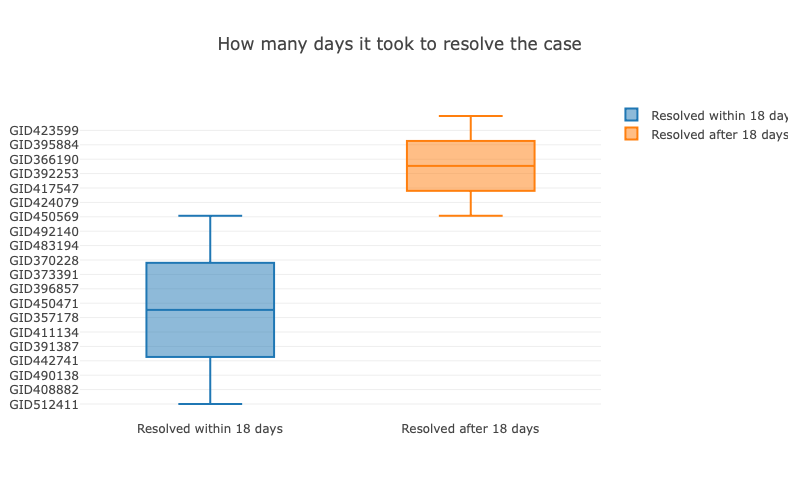

In [51]:
Image('../Images/Boxplot_days.jpg')

In the above box plot we are categorising the grievanceID into two categories:
   
   i) closed within  18 days.
   
   ii) Closed after 18 days.

In my scenario 18 days is a hyperparameter which can be changed.
I chose 18 days because i took the mean of days, which gave me 17.32 as mean value. So i chose 18 days as a hyperparamter.

Test part

In [63]:
# converting into appropriate format
test_data["DateOfGrievance"] = pd.to_datetime(test_data["DateOfGrievance"], format="%Y/%m/%d")
test_data["DateOfResolution"] = pd.to_datetime(test_data["DateOfResolution"], format="%Y/%m/%d")

# Taking a difference between the dateofresolution and dateofGrievance to get an intuition of how many days it took to close the grievance.
test_data["DAYSDIFF"] = test_data["DateOfResolution"] - test_data["DateOfGrievance"]

In [64]:
# converting the DAYSDIFF datatype to timedelta64[D] which is time date format
test_data.DAYSDIFF = test_data.DAYSDIFF.astype('timedelta64[D]')

In [65]:
#Checking the datatypes of train data
test_data.dtypes

GrievanceID                     object
BankID                          object
State                           object
DateOfGrievance         datetime64[ns]
Grievance_Category              object
GrievanceDescription            object
LineOfBusiness                  object
ResolutionComments              object
Disputed                        object
DateOfResolution        datetime64[ns]
DAYSDIFF                       float64
dtype: object

In [66]:
#Checking the datatypes of train data
test_data.DAYSDIFF.describe()

count    27954.000000
mean        18.080919
std         10.224012
min          1.000000
25%         11.000000
50%         11.000000
75%         22.000000
max        170.000000
Name: DAYSDIFF, dtype: float64

# Text Mining

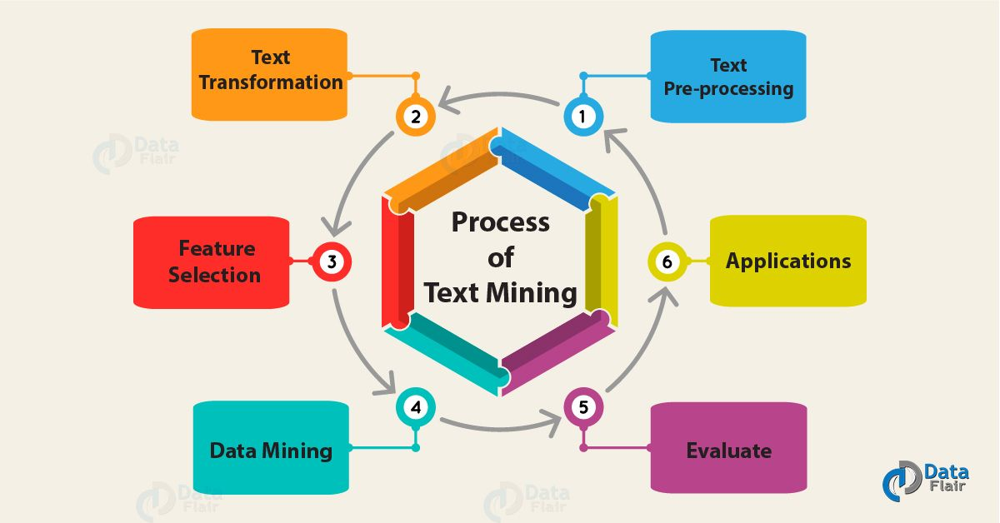

In [52]:
Image('../Images/Process-of-Text-Mining.jpg')

### Number of Words

One of the most basic features we can extract is the number of words in each GrievanceDescription. The basic intuition behind this is that generally, the negative sentiments contain a lesser amount of words than the positive ones.
To do this, we simply use the split function in python:

In [67]:
# With the help of appy function and lambda function we are able to get the number of words in each row or Grievance description column.
train_data['word_count'] = train_data['GrievanceDescription'].apply(lambda x: len(str(x).split(" ")))
train_data[['GrievanceDescription', 'word_count']].head() # Printing the column Grievance description and word_count of each Grievance description

,GrievanceDescription,word_count
51968,I was shocked when I reviewed my credit repor...,59
46777,Title Max will not give me any statements or ...,77
17190,Re : Disputing Value : Loan Modification for ...,395
8246,Received bad information about my loan I filed...,67
11016,Bank of America foreclosed on my home and sol...,62


In [68]:
# With the help of appy function and lambda function we are able to get the len of words in each row or Grievance description column.
test_data['word_count'] = test_data['GrievanceDescription'].apply(lambda x: len(str(x).split(" ")))
test_data[['GrievanceDescription', 'word_count']].head() # Printing the column Grievance description and word_count of each Grievance description

,GrievanceDescription,word_count
0,I currently have a mortgage with Flag star ba...,110
1,Bank5278 Auto Finance repossessed and subsequ...,79
2,We fell behind in our payments back in 2014 f...,374
3,My home is on XXXX parcels of land. The first...,436
4,We mortgaged our home with XXXX on XXXX/XXXX/...,90


### Number of characters

This feature is also based on the previous feature intuition. Here, we calculate the number of characters in each GrievanceDescription. This is done by calculating the length of the GrievanceDescription text.

In [69]:
# With the help of appy function and lambda function we are able to get the number of letters in each row or Grievance description column.
train_data['char_count'] = train_data['GrievanceDescription'].str.len() ## this also includes spaces
train_data[['GrievanceDescription','char_count']].head()# Printing the column Grievance description and char_count of each Grievance description

,GrievanceDescription,char_count
51968,I was shocked when I reviewed my credit repor...,291
46777,Title Max will not give me any statements or ...,415
17190,Re : Disputing Value : Loan Modification for ...,2217
8246,Received bad information about my loan I filed...,414
11016,Bank of America foreclosed on my home and sol...,311


Note that the calculation will also include the number of spaces, which you can remove, if required. But in this cae we haven't removed the blank spaces

In [70]:
# With the help of appy function and lambda function we are able to get the number of letters in each row or Grievance description column.
test_data['char_count'] = test_data['GrievanceDescription'].str.len() ## this also includes spaces
test_data[['GrievanceDescription','char_count']].head()# Printing the column Grievance description and char_count of each Grievance description

,GrievanceDescription,char_count
0,I currently have a mortgage with Flag star ba...,589
1,Bank5278 Auto Finance repossessed and subsequ...,456
2,We fell behind in our payments back in 2014 f...,1974
3,My home is on XXXX parcels of land. The first...,2228
4,We mortgaged our home with XXXX on XXXX/XXXX/...,562


### Average Word Length

We will also extract another feature which will calculate the average word length of each review. This can also potentially help us in improving our model.
Here, we simply take the sum of the length of all the words and divide it by the total length of the review text.

If few words are joined without spacing then the average word length will be more. And which can be removed with the help of rare words

In [71]:
def avg_word(sentence):
  words = sentence.split()
  return (sum(len(word) for word in words)/len(words)) # To claculate the average word in each greivance description

train_data['avg_word'] = train_data['GrievanceDescription'].apply(lambda x: avg_word(x))
train_data[['GrievanceDescription','avg_word']].head() # Printing the column Grievance description and avg_word of each Grievance description

,GrievanceDescription,avg_word
51968,I was shocked when I reviewed my credit repor...,4.017241
46777,Title Max will not give me any statements or ...,4.460526
17190,Re : Disputing Value : Loan Modification for ...,4.604061
8246,Received bad information about my loan I filed...,5.194030
11016,Bank of America foreclosed on my home and sol...,4.098361


In [72]:
test_data['avg_word'] = test_data['GrievanceDescription'].apply(lambda x: avg_word(x))
test_data[['GrievanceDescription','avg_word']].head() # Printing the column Grievance description and avg_word of each Grievance description

,GrievanceDescription,avg_word
0,I currently have a mortgage with Flag star ba...,4.403670
1,Bank5278 Auto Finance repossessed and subsequ...,4.846154
2,We fell behind in our payments back in 2014 f...,4.292225
3,My home is on XXXX parcels of land. The first...,4.121839
4,We mortgaged our home with XXXX on XXXX/XXXX/...,5.314607


### Number of stopwords

Generally, while solving an NLP problem, the first thing we do is to remove the stopwords. But sometimes calculating the number of stopwords can also give us some extra information which we might have been losing before.
Here, we have imported stopwords from NLTK, which is a basic NLP library in python.


more number of stop words means more of junk information and if a greivance contains less of the stop words then that grievance can be important for us.

In [73]:
from nltk.corpus import stopwords
stop = stopwords.words('english') # Selecting the stop words from english dictionary

train_data['stopwords'] = train_data['GrievanceDescription'].apply(lambda x: len([x for x in x.split() if x in stop]))
train_data[['GrievanceDescription','stopwords']].head() # Printing the column Grievance description and stopwords of each Grievance description

,GrievanceDescription,stopwords
51968,I was shocked when I reviewed my credit repor...,25
46777,Title Max will not give me any statements or ...,33
17190,Re : Disputing Value : Loan Modification for ...,148
8246,Received bad information about my loan I filed...,30
11016,Bank of America foreclosed on my home and sol...,24


In [74]:
test_data['stopwords'] = test_data['GrievanceDescription'].apply(lambda x: len([x for x in x.split() if x in stop]))
test_data[['GrievanceDescription','stopwords']].head() # Printing the column Grievance description and stopwords of each Grievance description

,GrievanceDescription,stopwords
0,I currently have a mortgage with Flag star ba...,52
1,Bank5278 Auto Finance repossessed and subsequ...,28
2,We fell behind in our payments back in 2014 f...,189
3,My home is on XXXX parcels of land. The first...,196
4,We mortgaged our home with XXXX on XXXX/XXXX/...,30


### Number of special characters

One more interesting feature which we can extract from a review is calculating the number of special characters or mentions present in it. This also helps in extracting extra information from our text data.

In [75]:
special_chars = '''!"#%&'()*+,-./:;<=>?@[\\]^_`{|}~''' # creating a list of special characters in english dictionary
train_data['Special_chars'] = train_data['GrievanceDescription'].apply(lambda x: len([x for x in x.split() if x in special_chars]))

train_data[['GrievanceDescription','Special_chars']].head() # Printing the column Grievance description and special_characters of each Grievance description

,GrievanceDescription,Special_chars
51968,I was shocked when I reviewed my credit repor...,1
46777,Title Max will not give me any statements or ...,0
17190,Re : Disputing Value : Loan Modification for ...,4
8246,Received bad information about my loan I filed...,0
11016,Bank of America foreclosed on my home and sol...,3


In [76]:
test_data['Special_chars'] = test_data['GrievanceDescription'].apply(lambda x: len([x for x in x.split() if x in special_chars]))

test_data[['GrievanceDescription','Special_chars']].head() # Printing the column Grievance description and special_characters of each Grievance description

,GrievanceDescription,Special_chars
0,I currently have a mortgage with Flag star ba...,0
1,Bank5278 Auto Finance repossessed and subsequ...,0
2,We fell behind in our payments back in 2014 f...,0
3,My home is on XXXX parcels of land. The first...,3
4,We mortgaged our home with XXXX on XXXX/XXXX/...,0


<a id="ch10"></a>
# Preprocessing

##### After doing the data exploration now we can proceed with our preprocessing.

In the below function we are replacing all the specail characters or junk characters and keeping only sentences that have capital alphabets, small alphabets and digits. With the help of Regular Expressions.

In [77]:
cleanup_re = re.compile('[^A-Za-z0-9]+') #Regular Expresssion to store only alphabets (capital and small) and digits.


def cleanup(sentence):
    sentence = str(sentence)
    sentence = re.sub(r'\s+',' ',sentence) #\s is for white spaces
   # sentence = re.sub('[\d]','',sentence)  #\d is for digits
    sentence = sentence.lower() # converting into lower case
    sentence = cleanup_re.sub(' ', sentence).strip()
    #sentence = " ".join(nltk.word_tokenize(sentence))
    return sentence


# creating a dictionoary of decontracted words that occur in common typing languages.
def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase


train_data["Clean_GrievanceDescription"] = train_data["GrievanceDescription"].apply(cleanup) # applying cleanup function on data

train_data["Clean_GrievanceDescription"] = train_data["GrievanceDescription"].apply(decontracted) # applying decontracted function on data

# Test part

test_data["Clean_GrievanceDescription"] = test_data["GrievanceDescription"].apply(cleanup) # applying cleanup function on data

test_data["Clean_GrievanceDescription"] = test_data["GrievanceDescription"].apply(decontracted) # applying decontracted function on data

# Lower case

The first pre-processing step which we will do is transform our reviews into lower case. This avoids having multiple copies of the same words. For example, while calculating the word count, ‘Credit’ and ‘credit’ will be taken as different words.

In [78]:
train_data['Clean'] = train_data['Clean_GrievanceDescription'].apply(lambda x: " ".join(x.lower() for x in x.split()))
train_data[['Clean_GrievanceDescription','Clean']].head() # Printing the column Grievance description and Clean of each Grievance description after converting them to lower case

,Clean_GrievanceDescription,Clean
51968,I was shocked when I reviewed my credit repor...,i was shocked when i reviewed my credit report...
46777,Title Max will not give me any statements or ...,title max will not give me any statements or r...
17190,Re : Disputing Value : Loan Modification for ...,re : disputing value : loan modification for l...
8246,Received bad information about my loan I filed...,received bad information about my loan i filed...
11016,Bank of America foreclosed on my home and sol...,bank of america foreclosed on my home and sold...


In [79]:
test_data['Clean'] = test_data['Clean_GrievanceDescription'].apply(lambda x: " ".join(x.lower() for x in x.split()))
test_data[['Clean_GrievanceDescription','Clean']].head() # Printing the column Grievance description and Clean of each Grievance description after converting them to lower case

,Clean_GrievanceDescription,Clean
0,I currently have a mortgage with Flag star ba...,i currently have a mortgage with flag star ban...
1,Bank5278 Auto Finance repossessed and subsequ...,bank5278 auto finance repossessed and subseque...
2,We fell behind in our payments back in 2014 f...,we fell behind in our payments back in 2014 fo...
3,My home is on XXXX parcels of land. The first...,my home is on xxxx parcels of land. the first ...
4,We mortgaged our home with XXXX on XXXX/XXXX/...,we mortgaged our home with xxxx on xxxx/xxxx/x...


# Removing Punctuation

The next step is to remove punctuation, as it doesn’t add any extra information while treating text data. Therefore removing all instances of it will help us reduce the size of the training data. We are just double checking this step, incase our regular expression fails.

In [80]:
train_data['Clean'] = train_data['Clean'].str.replace('[^\w\s]','') # regular expression tto remove punctuation
train_data[['GrievanceDescription','Clean']].head() # Printing the column Grievance description and Clean of each Grievance description after removing punctuation.

,GrievanceDescription,Clean
51968,I was shocked when I reviewed my credit repor...,i was shocked when i reviewed my credit report...
46777,Title Max will not give me any statements or ...,title max will not give me any statements or r...
17190,Re : Disputing Value : Loan Modification for ...,re disputing value loan modification for loa...
8246,Received bad information about my loan I filed...,received bad information about my loan i filed...
11016,Bank of America foreclosed on my home and sol...,bank of america foreclosed on my home and sold...


In [81]:
test_data['Clean'] = test_data['Clean'].str.replace('[^\w\s]','') # regular expression tto remove punctuation
test_data[['GrievanceDescription','Clean']].head() # Printing the column Grievance description and Clean of each Grievance description after removing punctuation.

,GrievanceDescription,Clean
0,I currently have a mortgage with Flag star ba...,i currently have a mortgage with flag star ban...
1,Bank5278 Auto Finance repossessed and subsequ...,bank5278 auto finance repossessed and subseque...
2,We fell behind in our payments back in 2014 f...,we fell behind in our payments back in 2014 fo...
3,My home is on XXXX parcels of land. The first...,my home is on xxxx parcels of land the first y...
4,We mortgaged our home with XXXX on XXXX/XXXX/...,we mortgaged our home with xxxx on xxxxxxxxxxx...


# Removal of Stop Words

As we discussed earlier, stop words (or commonly occurring words) should be removed from the text data. For this purpose, we can either create a list of stopwords ourselves or we can use predefined libraries.

**We are appending additional list of stop words that we see common in our data.**

In [82]:
from nltk.corpus import stopwords #importing stopwords from nltk.corpus
# creating a newstopwords corpus based on our text Grievance descriptions.
newStopWords =  ["xxxx","xx","xxxxxxxx","xxxxxxxxxxxx","http","https","amp","rt","t","c","the",'a', u'about', u'above', u'after', u'again', u'against', u'all', u'am', u'an', u'and', u'any', u'are', u'arent', u'as', u'at', 
    u'be', u'because', u'been', u'before', u'being', u'below', u'between', u'both', u'but', u'by', 
    u'can', 'cant', 'come', u'could', 'couldnt', 
    u'd', u'did', u'didn', u'do', u'does', u'doesnt', u'doing', u'dont', u'down', u'during', 
    u'each', 
    u'few', 'finally', u'for', u'from', u'further', 
    u'had', u'hadnt', u'has', u'hasnt', u'have', u'havent', u'having', u'he', u'her', u'here', u'hers', u'herself', u'him', u'himself', u'his', u'how', 
    u'i', u'if', u'in', u'into', u'is', u'isnt', u'it', u'its', u'itself', 
    u'just', 
    u'll', 
    u'm', u'me', u'might', u'more', u'most', u'must', u'my', u'myself', 
    u'no', u'nor', u'not', u'now', 
    u'o', u'of', u'off', u'on', u'once', u'only', u'or', u'other', u'our', u'ours', u'ourselves', u'out', u'over', u'own', 
    u'r', u're', 
    u's', 'said', u'same', u'she', u'should', u'shouldnt', u'so', u'some', u'such', 
    u't', u'than', u'that', 'thats', u'the', u'their', u'theirs', u'them', u'themselves', u'then', u'there', u'these', u'they', u'this', u'those', u'through', u'to', u'too', 
    u'under', u'until', u'up', 
    u'very', 
    u'was', u'wasnt', u'we', u'were', u'werent', u'what', u'when', u'where', u'which', u'while', u'who', u'whom', u'why', u'will', u'with', u'wont', u'would', 
    u'y', u'you', u'your', u'yours', u'yourself', u'yourselves']

In [83]:
from nltk.corpus import stopwords
stop = stopwords.words('english')
stop.extend(newStopWords) # extending the stop words with the newstops words added manualy based on the text Grievance desription.
train_data['Clean'] = train_data['Clean'].apply(lambda x: " ".join(x for x in x.split() if x not in stop)) # Removing the stop words from the text
train_data[['GrievanceDescription','Clean']].head() # Printing the column Grievance description and Clean of each Grievance description after removing stopwords.

,GrievanceDescription,Clean
51968,I was shocked when I reviewed my credit repor...,shocked reviewed credit report found late paym...
46777,Title Max will not give me any statements or ...,title max give statements receipts payments ma...
17190,Re : Disputing Value : Loan Modification for ...,disputing value loan modification loan number ...
8246,Received bad information about my loan I filed...,received bad information loan filed federal fo...
11016,Bank of America foreclosed on my home and sol...,bank america foreclosed home sold home 2014 wi...


In [84]:
test_data['Clean'] = test_data['Clean'].apply(lambda x: " ".join(x for x in x.split() if x not in stop)) # Removing the stop words from the text
test_data[['GrievanceDescription','Clean']].head() # Printing the column Grievance description and Clean of each Grievance description after removing stopwords.

,GrievanceDescription,Clean
0,I currently have a mortgage with Flag star ba...,currently mortgage flag star bank payment late...
1,Bank5278 Auto Finance repossessed and subsequ...,bank5278 auto finance repossessed subsequently...
2,We fell behind in our payments back in 2014 f...,fell behind payments back 2014 following reall...
3,My home is on XXXX parcels of land. The first...,home parcels land first year lived home mailed...
4,We mortgaged our home with XXXX on XXXX/XXXX/...,mortgaged home assigned loan bank transferred ...


# Common word removal

Previously, we just removed commonly occurring words in a general sense. We can also remove commonly occurring words from our text data First, let’s check the 100 most frequently occurring words in our text data then take call to remove or retain.

In [85]:
# Removing the common words from Grievance Description column
freq = pd.Series(' '.join(train_data['GrievanceDescription']).split()).value_counts()[:100] # storing in freq the value_counts of the common words. (note we are selecting the first 100 words only, this can be changed)
freq # displaying the frequenct counts of the common words.

the            509473
I              467673
to             433061
XXXX           374516
and            335196
a              254866
my             233299
of             207729
that           193935
was            186756
in             141921
for            133253
on             128826
have           124563
they           122133
not            118367
is             108001
with           105249
me              98688
this            85779
it              72361
credit          65230
from            63589
had             62989
be              57146
as              55885
would           53343
payment         52419
loan            50753
XXXX,           50287
                ...  
will            24230
when            24151
Bank            23646
out             23107
never           23047
can             22964
so              22675
This            22583
''              22543
could           22375
paid            22305
made            22181
due             21847
about           21772
you       

In [86]:
# Removing the common words from clean column
freq_clean_column = pd.Series(' '.join(train_data['Clean']).split()).value_counts()[:100] # storing in freq the value_counts of the common words (note we are selecting the first 100 words only, this can be changed)
freq_clean_column  # displaying the frequenct counts of the common words.

credit         76363
loan           66440
payment        65229
account        63208
card           50151
bank           45324
mortgage       39499
told           39206
payments       39193
received       35622
time           33336
called         29658
pay            28519
due            26445
get            25809
never          24978
interest       24814
paid           24536
made           24129
information    23949
back           23461
late           23284
home           23008
company        22615
sent           22457
amount         21956
balance        21907
us             21447
call           21162
letter         21088
               ...  
year           10763
complaint      10680
day            10656
issue          10645
documents      10640
need           10422
like           10217
stated         10184
want           10160
rate           10049
applied        10017
foreclosure     9873
requested       9818
charged         9738
email           9719
insurance       9653
last         

In [87]:
freq_1 = list(freq_clean_column.index)
train_data['Clean'] = train_data['Clean'].apply(lambda x: " ".join(x for x in x.split() if x not in freq_1))# Removing the most common words
train_data['Clean'].head()

51968    shocked reviewed found dates 30 past xxxx2016 ...
46777    title max give statements receipts accrue seem...
17190    disputing value approved 2016 careful review n...
8246     bad filed federal forgiveness program educatio...
11016    foreclosed sold 2014 promissory note salei lat...
Name: Clean, dtype: object

### Test part

In [88]:
# Removing the common words from Grievance Description column
freq = pd.Series(' '.join(test_data['GrievanceDescription']).split()).value_counts()[:100] # storing in freq the value_counts of the common words (note we are selecting the first 100 words only, this can be changed)
freq # displaying the frequenct counts of the common words.

I              241241
the            228794
to             212869
XXXX           167592
and            161531
my             124221
a              117377
that            91121
was             89294
of              89145
in              67023
have            63743
for             62946
they            60774
on              60244
not             56477
with            52444
is              50841
me              49692
this            40395
it              35209
had             29876
payment         29602
from            29559
be              27973
loan            27499
credit          27358
would           26584
as              26106
been            22506
                ...  
when            12400
out             12232
can             12205
will            12196
so              11718
never           11671
any             11646
could           11640
's              11508
XX/XX/XXXX      11324
over            11270
paid            11106
up              11039
This            10652
made      

In [89]:
# Removing the common words from Clean column
freq_clean_column = pd.Series(' '.join(test_data['Clean']).split()).value_counts()[:100] # storing in freq the value_counts of the common words (note we are selecting the first 100 words only, this can be changed)
freq_clean_column # displaying the frequenct counts of the common words.

payment        36350
loan           34740
credit         32415
account        30623
payments       26259
told           19944
card           19813
mortgage       17435
pay            17141
received       16745
time           16588
navient        16463
interest       15157
called         14701
loans          14195
get            13954
due            12740
never          12557
company        12195
paid           12186
bank           12064
information    12054
amount         11883
made           11473
late           11332
month          11325
back           11189
call           10871
bank5372       10456
sent           10170
               ...  
first           5180
need            5147
calls           5144
fee             5118
synchrony       5114
ca              5107
day             5080
debt            5080
every           5070
charged         5060
want            5046
several         5031
charge          4905
escrow          4883
request         4835
last            4794
issue        

In [90]:
freq_1 = list(freq_clean_column.index)
test_data['Clean'] = test_data['Clean'].apply(lambda x: " ".join(x for x in x.split() if x not in freq_1))# Removing the most common words
test_data['Clean'].head()

0    currently flag star reaching flagstar xxxxxxxx...
1    auto finance repossessed subsequently sold car...
2    fell behind 2014 following really unreasonable...
3    parcels land lived mailed real estate tax bill...
4    mortgaged assigned transferred escrowed 260000...
Name: Clean, dtype: object

# Rare words removal

Similarly, just as we removed the most common words, this time let’s remove rarely occurring words from the text. Because they’re so rare, the association between them and other words is dominated by noise. You can replace rare words with a more general form and then this will have higher counts

In [91]:
# Removing the rare words from Grievance Description column
freq = pd.Series(' '.join(train_data['GrievanceDescription']).split()).value_counts()[-100:] # storing in freq the value_counts of the rare words (note we are selecting the first 100 words only, this can be changed)
freq # displaying the frequenct counts of the rare words.

recertified.               1
recommitment               1
self-preservation          1
getiting                   1
XXXX/XXXX/2014Honorable    1
processes..                1
15.40                      1
UNWRITTEN                  1
MOM.                       1
0}.                        1
TAGGING                    1
unfreezing.                1
deal..approximately        1
taxes.I                    1
180K                       1
RECIEPTS                   1
hoBank5359which            1
8.79                       1
reremediation              1
illegal.When               1
PREPENALTY                 1
CONSUMER,                  1
servicer.Bank5279          1
1-Year                     1
Morgtage                   1
newlyconstructed           1
CA.on                      1
privatize                  1
forgery.They               1
horns                      1
                          ..
adapted                    1
pac.                       1
number".                   1
filded        

In [92]:
freq = pd.Series(' '.join(train_data['Clean']).split()).value_counts()[-100:] # storing in freq the value_counts of the rare words (note we are selecting the first 100 words only, this can be changed)
freq # displaying the frequenct counts of the rare words.

wordforword                                     1
rearended                                       1
contractorbut                                   1
disbbank5380ement                               1
prodded                                         1
ompleted                                        1
acceptpay                                       1
782                                             1
wecould                                         1
circumstancesthe                                1
reppayment                                      1
paidanother                                     1
xxxxcouple                                      1
3372                                            1
unaffordsble                                    1
jerseyi                                         1
xxxxally                                        1
tuttions                                        1
reportedxxxxxxxx                                1
ttempt                                          1


In [93]:
freq_1 = list(freq_clean_column.index)
train_data['Clean'] = train_data['Clean'].apply(lambda x: " ".join(x for x in x.split() if x not in freq_1))# Removing the most rare words
train_data['Clean'].head()

51968    shocked reviewed found dates 30 past xxxx2016 ...
46777    title max give statements receipts accrue seem...
17190    disputing value approved 2016 careful review n...
8246     bad filed federal forgiveness program educatio...
11016    foreclosed sold 2014 promissory note salei lat...
Name: Clean, dtype: object

#### Test part

In [94]:
# Removing the rare words from Grievance Description column
freq = pd.Series(' '.join(test_data['GrievanceDescription']).split()).value_counts()[-100:] # storing in freq the value_counts of the rare words (note we are selecting the first 100 words only, this can be changed)
freq # displaying the frequenct counts of the rare words.

download/print          1
TEAM.                   1
sabatage                1
ofmy                    1
sign!                   1
later.I                 1
spades.                 1
Justice?                1
order-there             1
WITHDRAWING             1
22.99                   1
2,3                     1
buit                    1
86.15                   1
Diem                    1
bBank5372ting,          1
{$42000.00},            1
deceivable              1
notice/request          1
REP!!!!!!!              1
promised/advertised     1
consipracy.             1
XXXX/mon                1
1-08                    1
eak                     1
solicited,              1
great!!                 1
4.based                 1
happenig                1
miscommunicating        1
                       ..
unyielding,             1
alarmed.                1
ek                      1
31.04.027               1
home/loan               1
HPA.pdf                 1
repoting                1
popup       

In [95]:
freq = pd.Series(' '.join(test_data['Clean']).split()).value_counts()[-100:] # storing in freq the value_counts of the rare words (note we are selecting the first 100 words only, this can be changed)
freq # displaying the frequenct counts of the rare words.

nonoem                     1
billxxxxxxxx               1
p16742_navient_xxxxxxxx    1
originalsecured            1
exampt                     1
documentsdisclosure        1
xxxxyyyypackage            1
xxxxnavigant               1
farmed                     1
partaking                  1
embossment                 1
godknowswhat               1
whys                       1
microscope                 1
fudiciary                  1
chest                      1
confirmxxxx                1
unsearchable               1
memebership                1
agreedsigned               1
affectionately             1
nartionstar                1
ipled                      1
haave                      1
1income                    1
palm                       1
myselfhave                 1
monthim                    1
hecould                    1
decesion                   1
                          ..
gazelle                    1
343                        1
consipracy                 1
unraveled     

In [96]:
freq_1 = list(freq_clean_column.index)
test_data['Clean'] = test_data['Clean'].apply(lambda x: " ".join(x for x in x.split() if x not in freq_1))# Removing the most rare words
test_data['Clean'].head()

0    currently flag star reaching flagstar xxxxxxxx...
1    auto finance repossessed subsequently sold car...
2    fell behind 2014 following really unreasonable...
3    parcels land lived mailed real estate tax bill...
4    mortgaged assigned transferred escrowed 260000...
Name: Clean, dtype: object

# Spelling correction

We’ve all seen reviews with a plethora of spelling mistakes. Our timelines are often filled with hastly sent reviews that are barely legible at times.
In that regard, spelling correction is a useful pre-processing step because this also will help us in reducing multiple copies of words. For example, “Analytics” and “analytcs” will be treated as different words even if they are used in the same sense.
To achieve this we will use the textblob library. If you are not familiar with it, you can check my previous article on ‘NLP for beginners using textblob’.

#### test part

# Tokenization

Tokenization refers to dividing the text into a sequence of words or sentences. In our example, we have used the textblob library to first transform our reviews into a blob and then converted them into a series of words.

In [97]:
train_data_tokenized = TextBlob(str(train_data['Clean'])).words #using Textblob to tokenize the text.

In [98]:
print(len( TextBlob(str(train_data['Clean'])).words))
print(len(train_data_tokenized)) # printing the elngth of tokenized words

458
458


#### Test part

In [99]:
test_data_tokenized = TextBlob(str(test_data['Clean'])).words #using Textblob to tokenize the text.

In [100]:
print(len( TextBlob(str(test_data['Clean'])).words))
print(len(test_data_tokenized)) # printing the elngth of tokenized words

446
446


# Lemmatization

Lemmatization is a more effective option than stemming because it converts the word into its root word, rather than just stripping the suffices. It makes use of the vocabulary and does a morphological analysis to obtain the root word. Therefore, we usually prefer using lemmatization over stemming.

In [101]:
from textblob import Word # from textblob importing word
train_data['Clean_lemmed'] = train_data['Clean'].apply(lambda x: " ".join([Word(word).lemmatize() for word in x.split()])) # Lemmatizing the owrds using lemmatize()
train_data['Clean_lemmed'].head() # printing the lemmatized words

51968    shocked reviewed found date 30 past xxxx2016 s...
46777    title max give statement receipt accrue seems ...
17190    disputing value approved 2016 careful review n...
8246     bad filed federal forgiveness program educatio...
11016    foreclosed sold 2014 promissory note salei lat...
Name: Clean_lemmed, dtype: object

#### test part

In [102]:
test_data['Clean_lemmed'] = test_data['Clean'].apply(lambda x: " ".join([Word(word).lemmatize() for word in x.split()])) # Lemmatizing the owrds using lemmatize()
test_data['Clean_lemmed'].head() # printing the lemmatized words

0    currently flag star reaching flagstar xxxxxxxx...
1    auto finance repossessed subsequently sold car...
2    fell behind 2014 following really unreasonable...
3    parcel land lived mailed real estate tax bill ...
4    mortgaged assigned transferred escrowed 260000...
Name: Clean_lemmed, dtype: object

# Term Frequency – Inverse Document Frequency (TF-IDF)

TF - IDF is calculated using TfidfVectorizer

Converting words to numeric data that the model can understand.

In [103]:
from sklearn.feature_extraction.text import TfidfVectorizer

# With the help of TfidfVectorizer converting text to numeric data
tfidf = TfidfVectorizer(max_features=1000, lowercase=True, analyzer='word',
 stop_words= 'english',ngram_range=(1,1)) # creating an object of TfidfVectorizer
train_vect = tfidf.fit_transform(train_data['Clean_lemmed']) # fitting the above object on clean_lemmed column

train_vect

<53680x1000 sparse matrix of type '<class 'numpy.float64'>'
	with 1718993 stored elements in Compressed Sparse Row format>

In [104]:
train_vect_data = train_vect.todense()# converting from sparse matrix to dense matrix
train_vect_data

matrix([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]])

In [105]:
#converting into a dataframe
train_vect_df = pd.DataFrame(train_vect_data)

#### Test part

In [106]:
# With the help of TfidfVectorizer converting text to numeric data
tfidf = TfidfVectorizer(analyzer='word',
 stop_words= 'english',ngram_range=(1,1))# creating an object of TfidfVectorizer
test_vect = tfidf.fit_transform(test_data['Clean_lemmed']) # fitting the above object on clean_lemmed column

test_vect

<27954x33816 sparse matrix of type '<class 'numpy.float64'>'
	with 1261593 stored elements in Compressed Sparse Row format>

In [107]:
test_vect_data = test_vect.todense()# converting from sparse matrix to dense matrix
test_vect_data

matrix([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]])

In [108]:
#converting into a dataframe
test_vect_df = pd.DataFrame(test_vect_data)

# Reading the pdf document

Note: The below method is used to read the pdf document.

I haven't used this method in the phd because while reading the document the pyPDF2 was not seperating words by space while reading the document.

**Preprocessing has been done till here.**

**Below i have done clustering to classify the Grievance Description as UFDP or non UFDP**

<a id="ch12"></a>
# Clustering

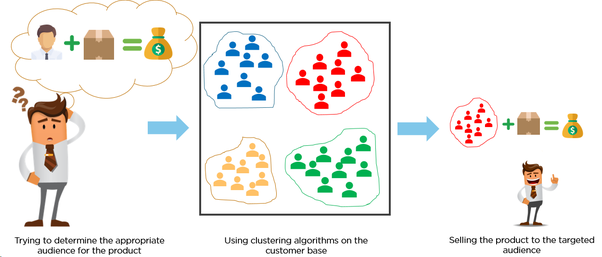

In [53]:
Image('../Images/Clustering.png')

>I have used 4 method for clustering the data and then build models on all 4 clusters to identify which is performing best.

# Methods of clustering

1. [Method 1 - # DOC2VEC using the ftca sec5 file training on the normal Grievance description data](#ch14)
2. [Method 2 - # # DOC2VEC using the ftca sec5 file training on the Cleaned Grievance description](#ch15)
3. [Method 3 - # PDF combined doc2vec](#ch16)
4. [Method 4 - # Clustering method with text data (GrievanceDescription)](#ch13)

**Unfair or Deceptive Acts or Practices** -> **UFDP**  -> **0**
      
**Non Unfair or Deceptive Acts or Practices** -> **Non UFDP** -> **1**

<a id="ch14"></a>
# Clustering method 1

#### DOC2VEC using the ftca sec5 file training on the normal Grievance description data

**In Clustering method 1: I have used the ftca sec5 pdf document and trained my doc2vec model on that, predicted on Grievance descriptions**

#### Train part

In [109]:
# Tagging the documents for doc2vec and to get the count of the number of documents.
# Tagging the pdf document as 0, which means that there is one document, which will be our pretrained model.
documents = [TaggedDocument(doc, [i]) for i, doc in enumerate(pdf_doc.Text)]
 
print (documents)# printing the documents.
# In our scenario in cluster 1 it contains only 1 document

[TaggedDocument(words='Federal Trade Commission Act\nSection 5: Unfair or Deceptive Acts or Practices\n Background\nSection 5(a) of the Federal Trade Commission Act (FTC Act) (15 USC §45) prohibits “unfair or deceptive acts or practices in or affecting commerce.” This prohibition applies to all persons engaged in commerce, including banks. The Board has affirmed its authority under section 8 of the Federal Deposit Insurance Act to take appropriate action when unfair or deceptive acts or practices (UDAP) are discovered.\nOn March 11, 2004, the Board and the Federal Deposit Insurance Corporation (FDIC) issued a joint statement (Joint Statement) regarding the agencies’ responsibilities to enforce the prohibi- tions against unfair or deceptive trade practices as they apply to state-chartered banks. The Joint Statement contains a discussion of managing risks relating to UDAP and general guidance on mea- sures that state-chartered banks can take to avoid engaging in such acts or practices, i

In [110]:
#Vector size as 5, window size as 2
#These are the hyper-parameters which can be tuned.
model = Doc2Vec(documents, size=5, window=2, min_count=1, workers=4) # Creating a doc2vec model for the above ftca pdf file.
# Note the size of the vector we are setting to 5 which can also be tuned.
#Persist a model to disk:

#gensim.test.utils.get_tmpfile("my_doc2vec_model")
#Get full path to file my_doc2vec_model in temporary folder. 
#This function doesn’t creates file (only generate unique name). 
#Also, it may return different paths in consecutive calling.
from gensim.test.utils import get_tmpfile
fname = get_tmpfile("my_doc2vec_model")

#And storing it in fname
print (fname)

/var/folders/nm/kmfc7hh57p159g5n78lh96w80000gn/T/my_doc2vec_model


In [111]:
#save and load model from saved file
model.save(fname)
model = Doc2Vec.load(fname)  

# you can continue training with the loaded model!
#If you’re finished training a model (=no more updates, only querying, reduce memory usage), you can do:
model.delete_temporary_training_data(keep_doctags_vectors=True, keep_inference=True)

**We have created a pre-trained doc2vec representation of our pdf document which can be used to infer on our Grievace descriptions.**

#### using the above pretrained doc2vec representation to get the vector representation on the train_docs -> GrievanceDescription

In [112]:
#Loading the pre-trained model
model=fname

In [113]:
#inference hyper-parameters
start_alpha=0.01 # learning rate
infer_epoch=1 # number of epochs
 
#load model
m = g.Doc2Vec.load(model)

In [114]:
#Storing the text decsription as a list
text_description = train_data.GrievanceDescription.values.tolist()
#copying the text_description list to train_docs and printing
train_docs = text_description
train_docs

[' I was shocked when I reviewed my credit report and found late payment on the dates below : 30 days past due XXXX/2016 I am not sure how this happened, I believe that I had made my payments to you when I received my statements. My only thought is that my monthly statement did not get to me.',
 ' Title Max will not give me any statements or receipts for payments made on the loan or how they accrue interest for payments. It seems I am never paid down. They lost my title and then placed a lien on the car when I demanded a full account summary and transaction statement. They are leaving me threatening voicemails to repossess my car and the balance is double what I borrowed after making payments for a year.',
 ' Re : Disputing Value : Loan Modification for Loan Number : XXXX I was approved for a loan modification in XXXX 2016. After careful review of the documents I noticed the value of the home that Ocwen was using was not the true value of the home. I disputed the value and I received a

In [115]:
# In our case X is for train grievance descriptions
# creating an empty list X to store the doc2vec (vector) representation of each document(Grievance Description). Each document here would mean each Grievance description.
X=[]
for d in train_docs: #take each document from train_docs
     
    X.append( m.infer_vector(d, alpha=start_alpha, steps=infer_epoch) ) #With the help of model.infervector append the vector representation of each document to X.
# In the above method we are creating a doc2vec for each document of the grievance decription

In [116]:
#Storing the text decsription as a list
text_description_test = test_data.GrievanceDescription.values.tolist()
#copying the text_description list to train_docs and printing
test_docs = text_description_test
test_docs

[" I currently have a mortgage with Flag star bank, my XX/XX/XXXX payment was late reaching flag-star on XXXX/XXXX/15. I 've had this loan for over a year now and it 's the first time my payment was late due to personal issue. I 'm currently current with all other payments, just received notice that my loan is going to be service by XXXX as of XX/XX/XXXX. I have no interest for my loan being transferred over to this company, who can I address this issue with. I just looked up this company and nothing but horror stories have been posted. How can I avoid my loan from being transferred..",
 " Bank5278 Auto Finance repossessed and subsequently sold my car while it was under my husband 's Chapter XXXX Bankruptcy. When I inquired to Bank5278 about regaining possession and rectifying the account I was told to call back when the bankruptcy was over. I called back. They had already sold car. My credit report showed a repossession and recovery amount owed. I was not given a chance by Bank5278 to

In [117]:
# In our case Y is for test grievance descriptions
# creating an empty list Y to store the doc2vec (vector) representation of each document(Grievance Description). Each document here would mean each Grievance description.
Y=[]
for d in test_docs: #take each document from train_docs
     
    Y.append( m.infer_vector(d, alpha=start_alpha, steps=infer_epoch) )  #With the help of model.infervector append the vector representation of each document to Y.
# In the above method we are creating a doc2vec for each document of the grievance decription

In [118]:
# Specifying the  number of clusters as 2
#Using the method of KMeansClusterer we are clustering the documents into two clusters using the distance as cosine distance.
NUM_CLUSTERS=2
kclusterer = KMeansClusterer(NUM_CLUSTERS, distance=nltk.cluster.util.cosine_distance, repeats=1)
assigned_clusters_Birch_alternative = kclusterer.cluster(X, assign_clusters=True) # Clustering the Train_docs(train grievance description stored in X) into 2 clusters
print (assigned_clusters_Birch_alternative)# printing the cluster values for each Grievance description.

[0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 

In [119]:
test_assigned_clusters_Birch_alternative = kclusterer.cluster(Y, assign_clusters=True) # Clustering the Test_docs(test grievance description stored in Y) into 2 clusters
print (test_assigned_clusters_Birch_alternative)# printing the cluster values for each Grievance description.

[1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 

In [120]:
#Storing the description in a variable GrievanceDescription
GrievanceDescription=train_data.GrievanceDescription

In [121]:
# Storing the cluster values in another varaible "Cluster_using_doc2vec_pdf_normal_method"
Cluster_using_doc2vec_pdf_normal_method = assigned_clusters_Birch_alternative
# Converting "Cluster_using_doc2vec_pdf_normal_method" into a dataframe
Cluster_using_doc2vec_pdf_normal_method = pd.DataFrame({'Cluster': Cluster_using_doc2vec_pdf_normal_method})
# Concatenating the Greivance description with the cluster values
result_Cluster_using_doc2vec_pdf_normal_method = pd.concat([GrievanceDescription,Cluster_using_doc2vec_pdf_normal_method], axis=1)

In [122]:
# printing the value_counts of each clusters
result_Cluster_using_doc2vec_pdf_normal_method.Cluster.value_counts()

1    30285
0    23395
Name: Cluster, dtype: int64

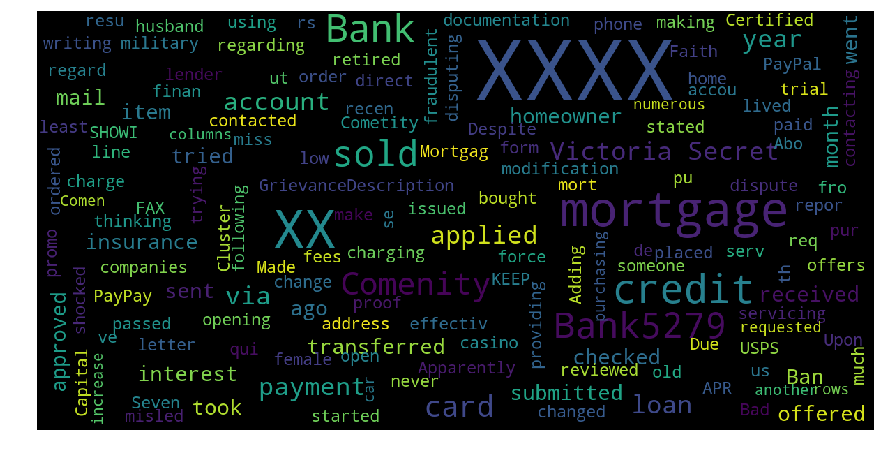

In [123]:
#Printing the most common words in cluster 1
show_wordcloud(result_Cluster_using_doc2vec_pdf_normal_method[["GrievanceDescription", "Cluster"]][result_Cluster_using_doc2vec_pdf_normal_method.Cluster==1])

The common words in the above word cloud are approved, received and so on. (1 -> Non UFDP)

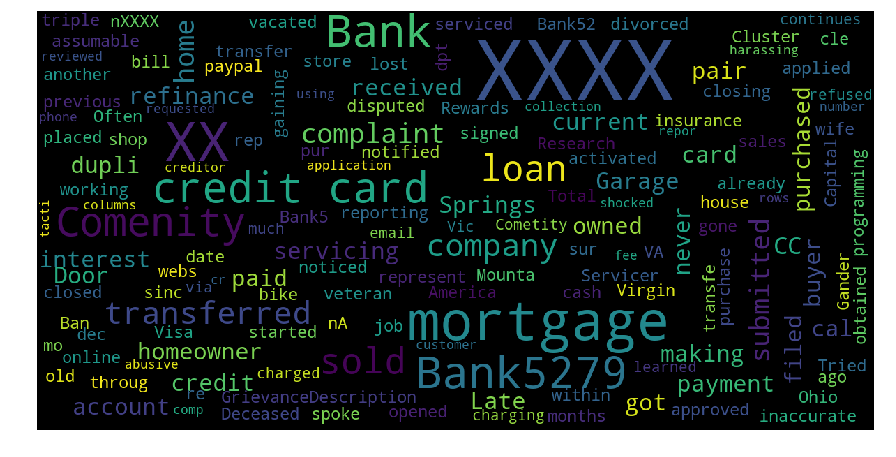

In [124]:
#Printing the most common words in cluster 0
show_wordcloud(result_Cluster_using_doc2vec_pdf_normal_method[["GrievanceDescription", "Cluster"]][result_Cluster_using_doc2vec_pdf_normal_method.Cluster==0])

The common words in the above word cloud are Shocked, harassing and so on. (0 -> UFDP)

In [125]:
# Plotting the percentage distribution of Grievance descriptions among the two clusters using plot_bar function.
plot_bar(result_Cluster_using_doc2vec_pdf_normal_method,'Cluster')

We see that 43.58% fall under UFDP category and 56.42% fall under Non - UFDP category
In the above plot 0 is UFDP and 1 is Non - UFDP

##### Test part

In [126]:
#Storing the description in an variable GrievanceDescription
test_GrievanceDescription = test_data.GrievanceDescription

In [127]:
# Storing the cluster values in another varaible "test_Cluster_using_doc2vec_pdf_normal_method"
test_Cluster_using_doc2vec_pdf_normal_method = test_assigned_clusters_Birch_alternative

# Converting "test_Cluster_using_doc2vec_pdf_normal_method" into a dataframe
test_Cluster_using_doc2vec_pdf_normal_method = pd.DataFrame({'Cluster': test_Cluster_using_doc2vec_pdf_normal_method})

# Concatenating the Greivance description with the cluster values
test_result_Cluster_using_doc2vec_pdf_normal_method = pd.concat([test_GrievanceDescription,test_Cluster_using_doc2vec_pdf_normal_method], axis=1)

In [128]:
# printing the value_counts of each clusters
test_result_Cluster_using_doc2vec_pdf_normal_method.Cluster.value_counts()

1    15975
0    11979
Name: Cluster, dtype: int64

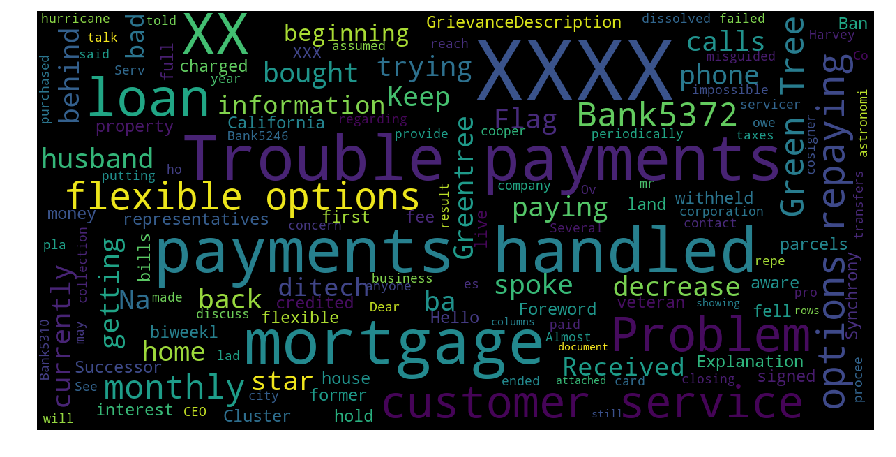

In [129]:
#Printing the most common words in cluster 1
show_wordcloud(test_result_Cluster_using_doc2vec_pdf_normal_method[["GrievanceDescription", "Cluster"]][test_result_Cluster_using_doc2vec_pdf_normal_method.Cluster==1])

The common words in the above word cloud are Received and so on.(1 -> Non UFDP)

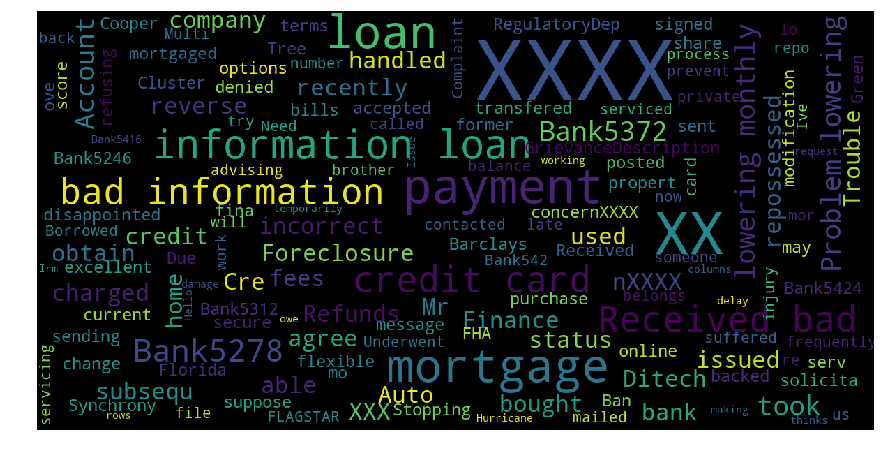

In [130]:
#Printing the most common words in cluster 0
show_wordcloud(test_result_Cluster_using_doc2vec_pdf_normal_method[["GrievanceDescription", "Cluster"]][test_result_Cluster_using_doc2vec_pdf_normal_method.Cluster==0])

The common words in the above word cloud are  bad, repaying so on. (0 -> UFDP)

In [131]:
# Plotting the percentage distribution of Grievance descriptions among the two clusters using plot_bar function.
plot_bar(test_result_Cluster_using_doc2vec_pdf_normal_method,'Cluster')

We see that 41.71% fall under UFDP category and 58.29% fall under Non - UFDP category
In the above plot 0 is UFDP and 1 is Non - UFDP

**In order to undertsand UFDP and Non UFDP. I have taken the pdf document and few grievance description and clustered them. Cluster values similar to pdf document are clustered as UFDP and others are classified as Non UFDP.**

In [132]:
# Reading the pdf and few grievance description data
cluster_pdf = pd.read_excel('../Dataset Exploration/cluster.xlsx')

In [133]:
# Tagging the documents for doc2vec and to get the count of the number of documents.
# Tagging the pdf document as 0, which means that there is one document, which will be our pretrained model.
documents_pdf = [TaggedDocument(doc, [i]) for i, doc in enumerate(cluster_pdf.Text)]

print (documents_pdf)# printing the documents.
# In our scenario in cluster 1 it contains only 1 document

[TaggedDocument(words='Federal Trade Commission Act\nSection 5: Unfair or Deceptive Acts or Practices\n Background\nSection 5(a) of the Federal Trade Commission Act (FTC Act) (15 USC §45) prohibits “unfair or deceptive acts or practices in or affecting commerce.” This prohibition applies to all persons engaged in commerce, including banks. The Board has affirmed its authority under section 8 of the Federal Deposit Insurance Act to take appropriate action when unfair or deceptive acts or practices (UDAP) are discovered.\nOn March 11, 2004, the Board and the Federal Deposit Insurance Corporation (FDIC) issued a joint statement (Joint Statement) regarding the agencies’ responsibilities to enforce the prohibi- tions against unfair or deceptive trade practices as they apply to state-chartered banks. The Joint Statement contains a discussion of managing risks relating to UDAP and general guidance on mea- sures that state-chartered banks can take to avoid engaging in such acts or practices, i

In [134]:
#Vector size as 5, window size as 2
#These are the hyper-parameters which can be tuned.
model = Doc2Vec(documents_pdf, size=5, window=2, min_count=1, workers=4)
# Note the size of the vector we are setting to 5 which can also be tuned.
#Persist a model to disk:

#gensim.test.utils.get_tmpfile("my_doc2vec_model")
#Get full path to file my_doc2vec_model in temporary folder. 
#This function doesn’t creates file (only generate unique name). 
#Also, it may return different paths in consecutive calling.
from gensim.test.utils import get_tmpfile
fname = get_tmpfile("my_doc2vec_model")

#And storing it in fname
print (fname)

/var/folders/nm/kmfc7hh57p159g5n78lh96w80000gn/T/my_doc2vec_model


In [135]:
#save and load model from saved file
model.save(fname)
model = Doc2Vec.load(fname)  

# you can continue training with the loaded model!
#If you’re finished training a model (=no more updates, only querying, reduce memory usage), you can do:
model.delete_temporary_training_data(keep_doctags_vectors=True, keep_inference=True) 

**We have created a pre-trained doc2vec representation of our pdf document which can be used to infer on our Grievace descriptions.**

#### using the above pretrained doc2vec represenattion to infer the doc2vec representation on the train_docs -> GrievanceDescription

In [136]:
#Loading the pre-trained model
model=fname

In [137]:
#inference hyper-parameters
start_alpha=0.01 # learning rate
infer_epoch=1 # number of epochs
 
#load model
m = g.Doc2Vec.load(model)

In [138]:
#Storing the text decsription as a list
text_description_pdf = cluster_pdf.Text.values.tolist()

#copying the text_description list to train_docs and printing
train_docs_pdf = text_description_pdf
train_docs_pdf

['Federal Trade Commission Act\nSection 5: Unfair or Deceptive Acts or Practices\n Background\nSection 5(a) of the Federal Trade Commission Act (FTC Act) (15 USC §45) prohibits “unfair or deceptive acts or practices in or affecting commerce.” This prohibition applies to all persons engaged in commerce, including banks. The Board has affirmed its authority under section 8 of the Federal Deposit Insurance Act to take appropriate action when unfair or deceptive acts or practices (UDAP) are discovered.\nOn March 11, 2004, the Board and the Federal Deposit Insurance Corporation (FDIC) issued a joint statement (Joint Statement) regarding the agencies’ responsibilities to enforce the prohibi- tions against unfair or deceptive trade practices as they apply to state-chartered banks. The Joint Statement contains a discussion of managing risks relating to UDAP and general guidance on mea- sures that state-chartered banks can take to avoid engaging in such acts or practices, including best practic

In [139]:
# In our case Z is for train grievance descriptions
# creating an empty list Z to store the doc2vec (vector) representation of each document(Grievance Description). Each document here would mean each Grievance description.
Z=[]
for d in train_docs_pdf: #take each document from train_docs
     
    Z.append( m.infer_vector(d, alpha=start_alpha, steps=infer_epoch) ) #With the help of model.infervector append the vector representation of each document to Y.
# In the above method we are creating a doc2vec for each document of the grievance decription

In [140]:
# Specifying the  number of clusters as 2
#Using the method of KMeansClusterer we are clustering the documents into two clusters using the distance as cosine distance.
kclusterer = KMeansClusterer(2, distance=nltk.cluster.util.cosine_distance, repeats=1) 
cluster_pdf_1_0 = kclusterer.cluster(Z, assign_clusters=True) # Clustering the Train_docs(train grievance description stored in Z) into 2 clusters
print (cluster_pdf_1_0)# printing the cluster values for each Grievance description.

[0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 

### This method can be used to understand what does 1 stand for and 0 stand for in the cluster.

In our scenario:

### UFDP -> 0
### Non UFDP -> 1

<a id="ch15"></a>
# Clustering method 2

**In Clustering method 2: I have used the ftca sec5 pdf document and trained my doc2vec model on that, predicted on cleaned Grievance descriptions**

##### DOC2VEC using the ftca sec5 file training on the Cleaned Grievance description

#### Train part

In [141]:
#Storing the text decsription as a list
text_description_cleaned_train = train_data.Clean.values.tolist()

#copying the text_description list to train_docs and printing
train_docs = text_description_cleaned_train
train_docs

['shocked reviewed found dates 30 past xxxx2016 sure happened believe statements thought',
 'title max give statements receipts accrue seems lost title placed lien car demanded summary transaction leaving threatening voicemails repossess car double borrowed making',
 'disputing value approved 2016 careful review noticed value using true value disputed value revised value difference resubmitted appraisal shows details needs completed refusing consideration appraisal shows difference recently attached original shows appraisal goal reflects try value offering affordable provided appraisal shows current value appraisal included comparable homes damage 77000 77000 per conversation today advised value offering 72000 appraisal submitted provided detailed notes cost repairs bring value fair market value disputing value offering based appraisal submitted evaluation team review appraisal consider value states appraisal based evaluation allow family stay affordable approved chapter judge used app

In [142]:
# In our case X is for train grievance descriptions
# creating an empty list X to store the doc2vec (vector) representation of each document(Grievance Description). Each document here would mean each Grievance description.
X=[]
for d in train_docs: #take each document from train_docs
     
    X.append( m.infer_vector(d, alpha=start_alpha, steps=infer_epoch) )  #With the help of model.infervector append the vector representation of each document to X. 
# In the above method we are creating a doc2vec for each document of the grievance decription

In [143]:
#Storing the text decsription as a list
text_description_cleaned_test = test_data.Clean.values.tolist()

#copying the text_description list to test_docs and printing
test_docs = text_description_cleaned_test
test_docs

['currently flag star reaching flagstar xxxxxxxx15 personal currently current notice transferred address looked nothing horror stories posted avoid transferred',
 'auto finance repossessed subsequently sold car husband chapter bankruptcy inquired regaining possession rectifying bankruptcy already sold car showed repossession recovery owed given chance regain possession car',
 'fell behind 2014 following really unreasonable 130000 placed 40 old live 120000 fell behind fact health problems medical condition lost 40000 family members moved contributing household notice 200000 point contact person informed difficulty needed man answered 400000 informed much awaiting tax return within week 700000 turned lawyer collection foreclosue precedings attempted order caught order response law office collection meantime getting behind looking forbearance finances track someone handles compliants puts side story tells behind says wo return talk feeling stressed son fear streets',
 'parcels land lived 

In [144]:
# In our case Y is for test grievance descriptions
# creating an empty list Y to store the doc2vec (vector) representation of each document(Grievance Description). Each document here would mean each Grievance description.
Y=[]
for d in test_docs:  #take each document from train_docs
     
    Y.append( m.infer_vector(d, alpha=start_alpha, steps=infer_epoch) ) #With the help of model.infervector append the vector representation of each document to Y.
# In the above method we are creating a doc2vec for each document of the grievance decription

In [145]:
# Specifying the  number of clusters as 2
#Using the method of KMeansClusterer where in the distance is cosine distance.
NUM_CLUSTERS=2
kclusterer = KMeansClusterer(NUM_CLUSTERS, distance=nltk.cluster.util.cosine_distance, repeats=1)
cluster_using_cleaned_data = kclusterer.cluster(X, assign_clusters=True)  # Clustering the Train_docs(train grievance description stored in X) into 2 clusters
print (cluster_using_cleaned_data) # printing the cluster values for each Grievance description.

[1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 

In [146]:
cluster_using_cleaned_data_test = kclusterer.cluster(Y, assign_clusters=True)  # Clustering the Test_docs(test grievance description stored in Y) into 2 clusters
print (cluster_using_cleaned_data_test) # printing the cluster values for each Grievance description.

[1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 

In [147]:
#Storing the description in an variable GrievanceDescription
GrievanceDescription_clean=train_data.Clean

In [148]:
# Storing the cluster values in another varaible "cluster_using_cleaned_data"
cluster_using_cleaned_data = cluster_using_cleaned_data

# Converting "cluster_using_cleaned_data" into a dataframe
cluster_using_cleaned_data = pd.DataFrame({'Cluster': cluster_using_cleaned_data})

# Concatenating the Greivance description with the cluster values
result_cluster_using_cleaned_data = pd.concat([GrievanceDescription_clean,cluster_using_cleaned_data], axis=1)

In [149]:
# printing the value_counts of each clusters
result_cluster_using_cleaned_data.Cluster.value_counts()

1    27516
0    26164
Name: Cluster, dtype: int64

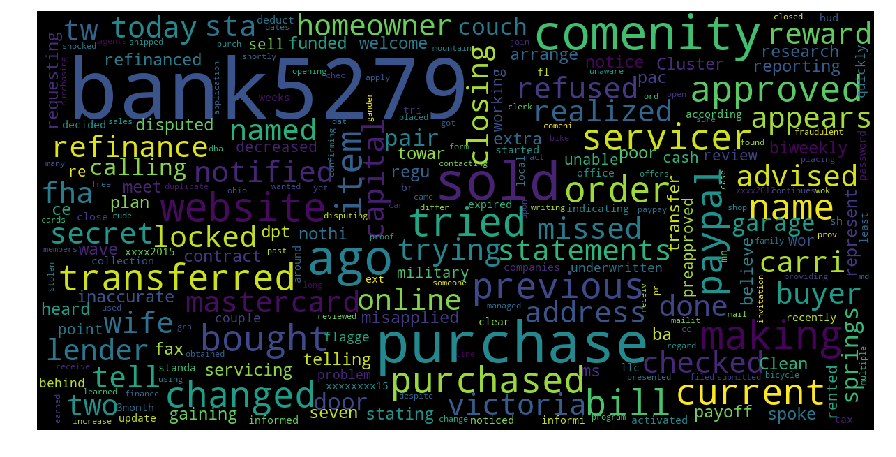

In [150]:
#Printing the most common words in cluster 1
show_wordcloud(result_cluster_using_cleaned_data[["Clean", "Cluster"]][result_cluster_using_cleaned_data.Cluster==1])

The common words in the above word cloud are Received and so on.(1 -> Non UFDP)

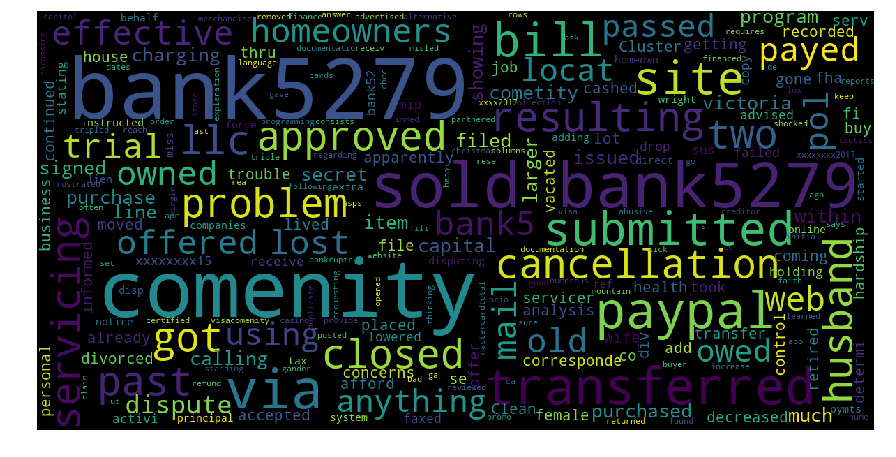

In [151]:
#Printing the most common words in cluster 0
show_wordcloud(result_cluster_using_cleaned_data[["Clean", "Cluster"]][result_cluster_using_cleaned_data.Cluster==0])

The common words in the above word cloud are  bad, repaying so on. (0 -> UFDP)

In [152]:
# Plotting the percentage distribution of Grievance descriptions among the two clusters using plot_bar function.
plot_bar(result_cluster_using_cleaned_data,'Cluster')

We see that 48.74% fall under UFDP category and 51.25.78% fall under Non - UFDP category In the above plot 0 is UFDP and 1 is Non - UFDP

##### Test part

In [153]:
#Storing the description in an variable GrievanceDescription
test_GrievanceDescription_cleaned = test_data.Clean

In [154]:
# Storing the cluster values in another varaible "cluster_using_cleaned_data_test"
cluster_using_cleaned_data_test = cluster_using_cleaned_data_test

# Converting "cluster_using_cleaned_data_test" into a dataframe
cluster_using_cleaned_data_test = pd.DataFrame({'Cluster': cluster_using_cleaned_data_test})

# Concatenating the Greivance description with the cluster values
result_cluster_using_cleaned_data_test = pd.concat([test_GrievanceDescription_cleaned,cluster_using_cleaned_data_test], axis=1)

In [155]:
# printing the value_counts of each clusters
result_cluster_using_cleaned_data_test.Cluster.value_counts()

1    14064
0    13890
Name: Cluster, dtype: int64

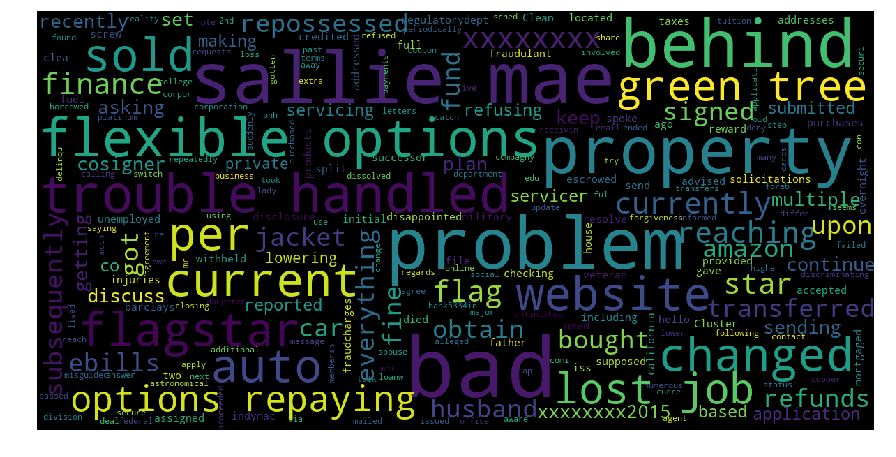

In [156]:
#Printing the most common words in cluster 1
show_wordcloud(result_cluster_using_cleaned_data_test[["Clean", "Cluster"]][result_cluster_using_cleaned_data_test.Cluster==1])

The common words in the above word cloud are Received and so on.(1 -> Non UFDP)

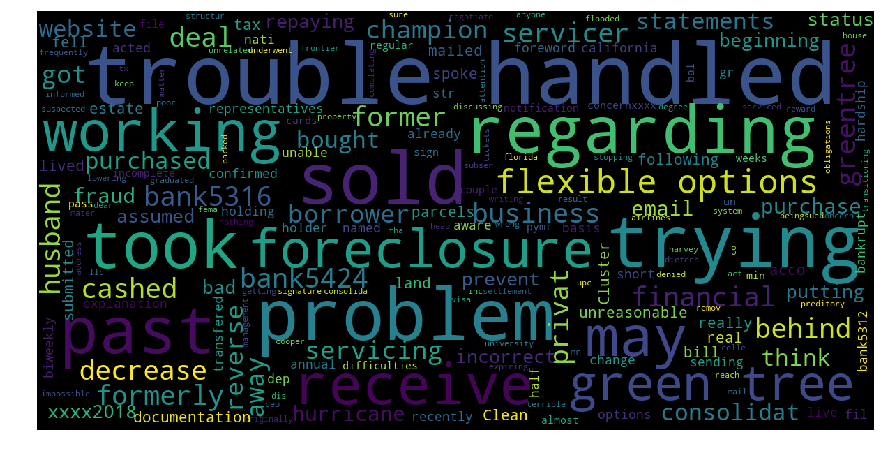

In [157]:
#Printing the most common words in cluster 0
show_wordcloud(result_cluster_using_cleaned_data_test[["Clean", "Cluster"]][result_cluster_using_cleaned_data_test.Cluster==0])

The common words in the above word cloud are  bad, repaying so on. (0 -> UFDP)

In [158]:
# Plotting the percentage distribution of Grievance descriptions among the two clusters using plot_bar function.
plot_bar(result_cluster_using_cleaned_data_test,'Cluster')

We see that 49.69% fall under UFDP category and 50.31% fall under Non - UFDP category In the above plot 0 is UFDP and 1 is Non - UFDP

<a id="ch16"></a>
# Clustering method 3

# PDF combined doc2vec

**In Clustering method 3: I have used the ftca sec5 pdf document and combined with the Consumer Compliance Handbook and  trained my doc2vec model on that, predicted on Grievance descriptions**

##### Train part

In [159]:
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
 
print (pdf_doc_combined.Text) # printing the text part of the pdf_combined

0    Federal Trade Commission Act\nSection 5: Unfai...
1    Consumer\nCompliance\nHandbook\nDivision of Co...
Name: Text, dtype: object


In [160]:
# Tagging the documents for doc2vec and to get the count of the number of documents.
# Tagging the pdf document as 0, which means that there is one document, which will be our pretrained model.
documents = [TaggedDocument(doc, [i]) for i, doc in enumerate(pdf_doc_combined.Text)]
 
print (documents)# printing the documents.

[TaggedDocument(words='Federal Trade Commission Act\nSection 5: Unfair or Deceptive Acts or Practices\n Background\nSection 5(a) of the Federal Trade Commission Act (FTC Act) (15 USC §45) prohibits “unfair or deceptive acts or practices in or affecting commerce.” This prohibition applies to all persons engaged in commerce, including banks. The Board has affirmed its authority under section 8 of the Federal Deposit Insurance Act to take appropriate action when unfair or deceptive acts or practices (UDAP) are discovered.\nOn March 11, 2004, the Board and the Federal Deposit Insurance Corporation (FDIC) issued a joint statement (Joint Statement) regarding the agencies’ responsibilities to enforce the prohibi- tions against unfair or deceptive trade practices as they apply to state-chartered banks. The Joint Statement contains a discussion of managing risks relating to UDAP and general guidance on mea- sures that state-chartered banks can take to avoid engaging in such acts or practices, i

In [161]:
#Vector size as 5, window size as 2
#These are the hyper-parameters which can be tuned.
model = Doc2Vec(documents, size=5, window=2, min_count=1, workers=4)
# Note the size of the vector we are setting to 5 which can also be tuned.
#Persist a model to disk:

#gensim.test.utils.get_tmpfile("my_doc2vec_model")
#Get full path to file my_doc2vec_model in temporary folder. 
#This function doesn’t creates file (only generate unique name). 
#Also, it may return different paths in consecutive calling.
from gensim.test.utils import get_tmpfile
fname = get_tmpfile("my_doc2vec_model")
print (fname)

/var/folders/nm/kmfc7hh57p159g5n78lh96w80000gn/T/my_doc2vec_model


In [162]:
#save and load model from saved file
model.save(fname)
model = Doc2Vec.load(fname)  

# you can continue training with the loaded model!
#If you’re finished training a model (=no more updates, only querying, reduce memory usage), you can do:
model.delete_temporary_training_data(keep_doctags_vectors=True, keep_inference=True)

In [163]:
#Infer vector for a new document:
vector = model.infer_vector(text_description)
print (vector)

[ 0.07565165 -0.01495922 -0.09956755  0.02988615  0.09632324]


**We have created a pre-trained model on our combined pdf documents which can be used as transform on our Grievace descriptions.**

##### transform on the train_docs -> GrievanceDescription using the pretrained on pdf combined file

In [164]:
from sklearn import metrics
import gensim.models as g
import codecs

In [165]:
model=fname

In [166]:
#inference hyper-parameters
start_alpha=0.01# learning rate
infer_epoch=1 # number of epochs
 
#load model
m = g.Doc2Vec.load(model)

In [167]:
# Specifying the  number of clusters as 2
#Using the method of KMeansClusterer we are clustering the documents into two clusters using the distance as cosine distance.
NUM_CLUSTERS=2
kclusterer = KMeansClusterer(NUM_CLUSTERS, distance=nltk.cluster.util.cosine_distance, repeats=1)
cluster_pdf_combined = kclusterer.cluster(X, assign_clusters=True) # Clustering the Train_docs(train grievance description stored in X) into 2 clusters
print (cluster_pdf_combined) # printing the cluster values for each Grievance description.

[0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 

In [168]:
# Storing the cluster values in another varaible "cluster_pdf_combined"
cluster_pdf_combined = cluster_pdf_combined

# Converting "cluster_pdf_combined" into a dataframe
cluster_pdf_combined = pd.DataFrame({'Cluster': cluster_pdf_combined})

# Concatenating the Greivance description with the cluster values
result_cluster_pdf_combined = pd.concat([GrievanceDescription,cluster_pdf_combined], axis=1)

In [169]:
# printing the value_counts of each clusters
result_cluster_pdf_combined.Cluster.value_counts()

0    27366
1    26314
Name: Cluster, dtype: int64

In [170]:
#We are finding how similar the document is to the ftca pdf
doc_id = random.randint(0, len(train_docs) - 1)
inferred_vector = m.infer_vector(train_docs[1])
sims = m.docvecs.most_similar([inferred_vector], topn=5)

In [171]:
# Compare and print the most/median/least similar documents from the train corpus
#print('Test Document ({}): «{}»\n'.format(20, ' '.join(test_docs[20])))
#print(u'SIMILAR/DISSIMILAR DOCS PER MODEL %s:\n' % m)
for label, index in [('MOST', 0), ('MEDIAN', len(sims)//2), ('LEAST', len(sims) - 1)]:
    print(u'%s %s' % (label, sims[index]))

MOST (1, 0.9494001269340515)
MEDIAN (0, 0.8977577686309814)
LEAST (0, 0.8977577686309814)


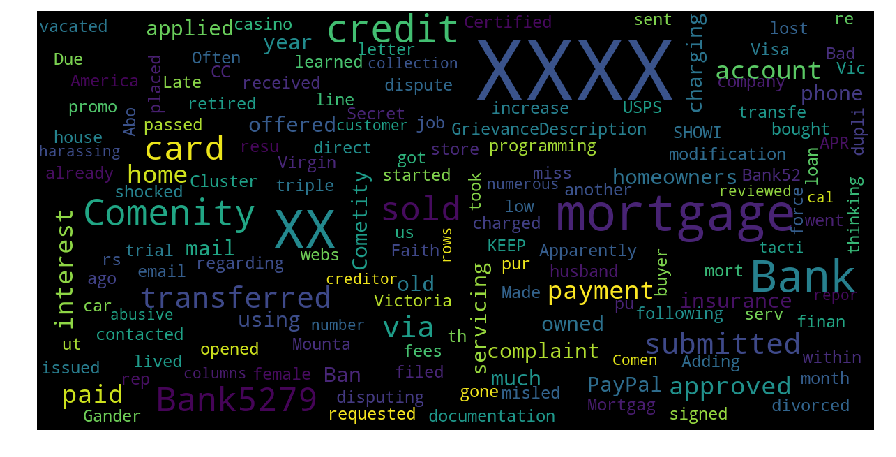

In [172]:
#Printing the most common words in cluster 1
show_wordcloud(result_cluster_pdf_combined[["GrievanceDescription", "Cluster"]][result_cluster_pdf_combined.Cluster==1])

The common words in the above word cloud are Received and so on.(1 -> Non UFDP)

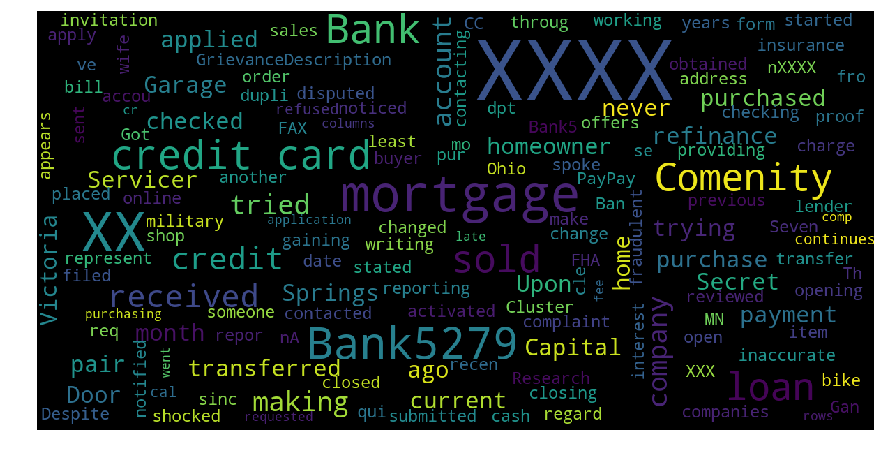

In [173]:
#Printing the most common words in cluster 0
show_wordcloud(result_cluster_pdf_combined[["GrievanceDescription", "Cluster"]][result_cluster_pdf_combined.Cluster==0])

The common words in the above word cloud are  bad, repaying so on. (0 -> UFDP)

In [174]:
# Plotting the percentage distribution of Grievance descriptions among the two clusters using plot_bar function.
plot_bar(result_cluster_pdf_combined, 'Cluster')

We see that 50.98% fall under UFDP category and 49.02% fall under Non - UFDP category In the above plot 0 is UFDP and 1 is Non - UFDP

###### Test part

#### transform on the train_docs -> GrievanceDescription using the pretrained on pdf combined file

In [175]:
cluster_pdf_combined_test = kclusterer.cluster(Y, assign_clusters=True) # Clustering the Test_docs(test grievance description stored in Y) into 2 clusters
print (cluster_pdf_combined_test) # printing the cluster values for each Grievance description.

[0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 

In [176]:
# Storing the cluster values in another varaible "cluster_pdf_combined_test"
cluster_pdf_combined_test = cluster_pdf_combined_test

# Converting "cluster_pdf_combined_test" into a dataframe
cluster_pdf_combined_test = pd.DataFrame({'Cluster': cluster_pdf_combined_test})

# Concatenating the Greivance description with the cluster values
result_cluster_pdf_combined_test = pd.concat([test_GrievanceDescription,cluster_pdf_combined_test], axis=1)

In [177]:
# printing the value_counts of each clusters
result_cluster_pdf_combined_test.Cluster.value_counts()

0    14064
1    13890
Name: Cluster, dtype: int64

In [178]:
#We are finding how similar the document is to the ftca pdf.
doc_id = random.randint(0, len(test_docs) - 1)
inferred_vector = m.infer_vector(test_docs[1])
sims = m.docvecs.most_similar([inferred_vector], topn=5)

In [179]:
# Compare and print the most/median/least similar documents from the train corpus
#print('Test Document ({}): «{}»\n'.format(20, ' '.join(test_docs[20])))
#print(u'SIMILAR/DISSIMILAR DOCS PER MODEL %s:\n' % m)
for label, index in [('MOST', 0), ('MEDIAN', len(sims)//2), ('LEAST', len(sims) - 1)]:
    print(u'%s %s' % (label, sims[index]))

MOST (1, 0.9387673139572144)
MEDIAN (0, 0.892510175704956)
LEAST (0, 0.892510175704956)


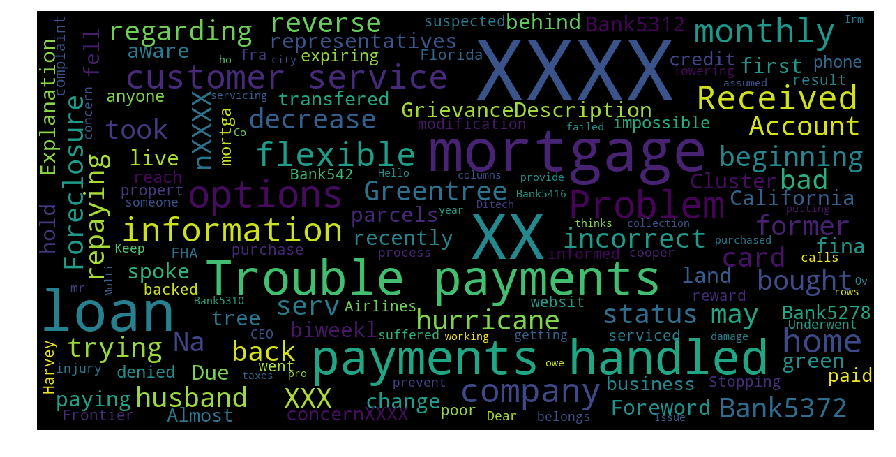

In [180]:
#Printing the most common words in cluster 1
show_wordcloud(result_cluster_pdf_combined_test[["GrievanceDescription", "Cluster"]][result_cluster_pdf_combined_test.Cluster==1])

The common words in the above word cloud are Received and so on.(1 -> Non UFDP)

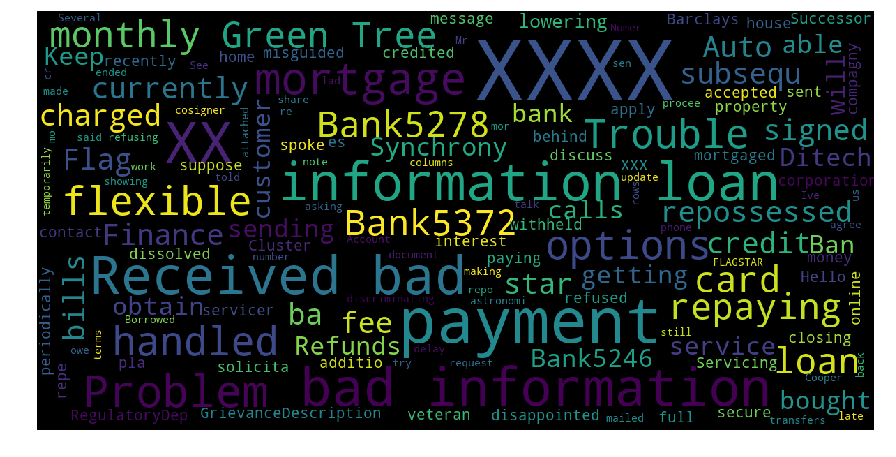

In [181]:
#Printing the most common words in cluster 0
show_wordcloud(result_cluster_pdf_combined_test[["GrievanceDescription", "Cluster"]][result_cluster_pdf_combined_test.Cluster==0])

The common words in the above word cloud are bad, repaying so on. (0 -> UFDP)

In [182]:
# Plotting the percentage distribution of Grievance descriptions among the two clusters using plot_bar function.
plot_bar(result_cluster_pdf_combined_test, 'Cluster')

We see that 50.31% fall under UFDP category and 49.69% fall under Non - UFDP category In the above plot 0 is UFDP and 1 is Non - UFDP

<a id="ch13"></a>
# Clustering method 4

**In Clustering method 4: In this method I have used the preprocessed text documents and converted them into tfidf and applied clustering on the tfidf to get two clusters 0 and 1.**

The technique used is Kmeans clustering.

Where **0** -> **Unfair or Deceptive Acts or Practices**
      
   **1** -> **Non Unfair or Deceptive Acts or Practices**

In [183]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(max_features=1000, lowercase=True, analyzer='word',
 stop_words= 'english',ngram_range=(1,1)) # creating an TfidfVectorizer object
train_vect = tfidf.fit_transform(train_data['Clean_lemmed']) # using TfidfVectorizer to get the tfidf of the text Grievance description

train_vect # printing the tfidf_vect

<53680x1000 sparse matrix of type '<class 'numpy.float64'>'
	with 1718993 stored elements in Compressed Sparse Row format>

In [184]:
train_vect = train_vect.todense() # converting to dense matrix from a sparse matrix
train_vect_df = pd.DataFrame(train_vect) # converting it to dataframe from a numpy array
train_vect_df.shape# printing the shape of train_vect_df to get the number of rows and columns.

(53680, 1000)

In [185]:
from sklearn.cluster import KMeans
model = KMeans(n_clusters=2) #using KMeans clustering to get 2 clusters
predicted_label = model.fit(train_vect_df)  # Clustering the tfidf of grievance description into 2 clusters
cluster_tfidf = model.labels_.tolist() # converting in to a list format

In [186]:
# Storing the cluster values in another varaible "Cluster_tfidf"
Cluster_tfidf = cluster_tfidf

# Converting "Cluster_tfidf" into a dataframe
Cluster_tfidf = pd.DataFrame({'Cluster': Cluster_tfidf})

# Concatenating the Greivance description with the cluster values
result_Cluster_tfidf = pd.concat([GrievanceDescription,Cluster_tfidf], axis=1)

In [187]:
# printing the value_counts of each clusters
result_Cluster_tfidf.Cluster.value_counts()

1    29518
0    24162
Name: Cluster, dtype: int64

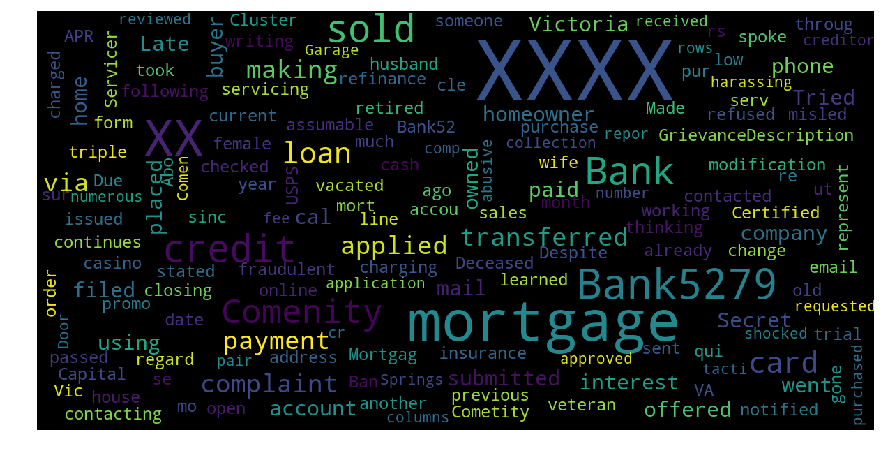

In [188]:
#Printing the most common words in cluster 1
show_wordcloud(result_Cluster_tfidf[["GrievanceDescription", "Cluster"]][result_Cluster_tfidf.Cluster==1])

The common words in the above word cloud are Received and so on.(1 -> Non UFDP)

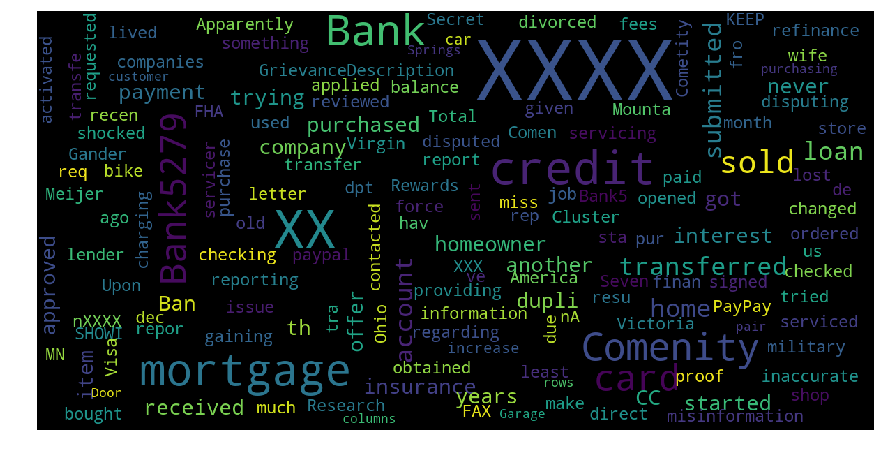

In [189]:
#Printing the most common words in cluster 0
show_wordcloud(result_Cluster_tfidf[["GrievanceDescription", "Cluster"]][result_Cluster_tfidf.Cluster==0])

The common words in the above word cloud are  bad, repaying so on. (0 -> UFDP)

In [190]:
# Plotting the percentage distribution of Grievance descriptions among the two clusters using plot_bar function.
plot_bar(result_Cluster_tfidf,'Cluster')

We see that 45.01% fall under UFDP category and 54.99% fall under Non - UFDP category In the above plot 0 is UFDP and 1 is Non - UFDP

### Test part

In [191]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(max_features=1000, lowercase=True, analyzer='word',
 stop_words= 'english',ngram_range=(1,1)) # creating an TfidfVectorizer object
test_vect = tfidf.fit_transform(test_data['Clean_lemmed'])  # using TfidfVectorizer to get the tfidf of the text Grievance description

test_vect # printing the test_vect

<27954x1000 sparse matrix of type '<class 'numpy.float64'>'
	with 858729 stored elements in Compressed Sparse Row format>

In [192]:
test_vect = test_vect.todense() # converting to dense matrix from a sparse matrix
test_vect_df = pd.DataFrame(test_vect) # converting it to dataframe from a numpy array
test_vect_df.shape # printing the shape of train_vect_df to get the number of rows and columns.

(27954, 1000)

In [193]:
from sklearn.cluster import KMeans
model = KMeans(n_clusters=2) #using KMeans clustering to get 2 clusters
predicted_label = model.fit(test_vect_df) # Clustering the tfidf of grievance description into 2 clusters
cluster_tfidf_test = model.labels_.tolist() # converting in to a list format

In [194]:
# Storing the cluster values in another varaible "Cluster_tfidf_test"
Cluster_tfidf_test = cluster_tfidf_test

# Converting "Cluster_tfidf_test" into a dataframe
Cluster_tfidf_test = pd.DataFrame({'Cluster': Cluster_tfidf_test})

# Concatenating the Greivance description with the cluster values
result_Cluster_tfidf_test = pd.concat([test_GrievanceDescription,Cluster_tfidf_test], axis=1)

In [195]:
# printing the value_counts of each clusters
result_Cluster_tfidf_test.Cluster.value_counts()

0    22613
1     5341
Name: Cluster, dtype: int64

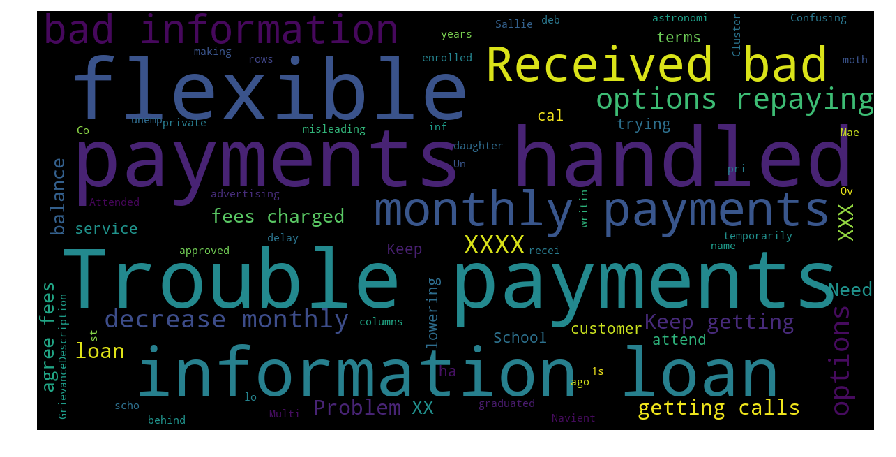

In [196]:
#Printing the most common words in cluster 1
show_wordcloud(result_Cluster_tfidf_test[["GrievanceDescription", "Cluster"]][result_Cluster_tfidf_test.Cluster==1])

The common words in the above word cloud are Received and so on.(1 -> Non UFDP)

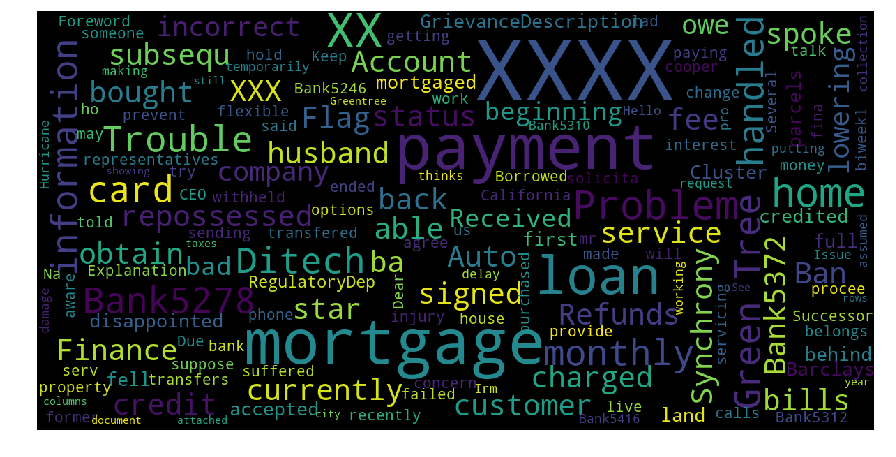

In [197]:
#Printing the most common words in cluster 0
show_wordcloud(result_Cluster_tfidf_test[["GrievanceDescription", "Cluster"]][result_Cluster_tfidf_test.Cluster==0])

The common words in the above word cloud are  bad, repaying so on. (0 -> UFDP)

# Plotting the clusters using TSNE

In [198]:
from sklearn.cluster import KMeans
km = KMeans(n_clusters=2,init= 'random', random_state= 5) # creating an object of KMeand clustering.
km.fit(X)   # Clustering the Train_docs(train grievance description stored in X) into 2 clusters
df_clustered = pd.DataFrame(km.labels_, train_data.index)
labels = km.labels_
# creating a dataframe of cluster values and train_data index values
clustered_series = pd.Series(index=train_data.index, data=labels)
clustered_series.value_counts().head()

0    26881
1    26799
dtype: int64

In [199]:
#taking only 100 data points for plotting
tsne_data = X[0:100]

In [200]:
np.array(X).shape

(53680, 5)

In [201]:
#taking only 100 data points for plotting
labels_100 = labels[0:100,]

In [202]:
# Ignore Warning
X_tsne = TSNE(random_state=1337).fit_transform(tsne_data)
X_tsne_df = pd.DataFrame(X_tsne, columns = ['X_tsne_1', 'X_tsne_2'])
X_tsne_df['labels'] = labels_100

In [203]:
X_tsne_df.head()

,X_tsne_1,X_tsne_2,labels
0,-5.348621,0.630805,0
1,-4.218572,1.424213,0
2,5.900961,3.710976,1
3,-1.276501,1.308639,0
4,-4.984218,-1.014303,0


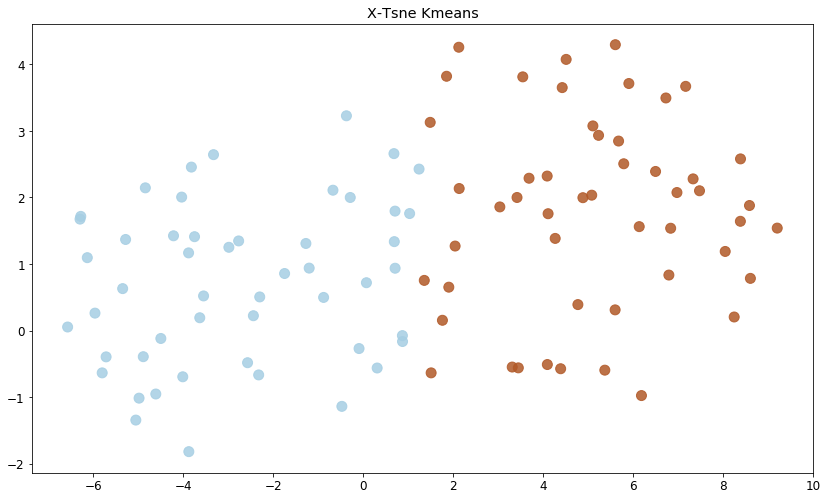

In [204]:
# Create the figure
fig = plt.figure( figsize=(14,8))
ax = fig.add_subplot(1, 1, 1, title='X-Tsne Kmeans' )
# Create the scatter
ax.scatter(
    x=X_tsne_df['X_tsne_1'], 
    y=X_tsne_df['X_tsne_2'], 
    c=X_tsne_df['labels'], 
    cmap=plt.cm.get_cmap('Paired'), 
    alpha=0.85,
    s=100)

#### Test part

In [208]:
from sklearn.cluster import KMeans
km = KMeans(n_clusters=2,init= 'random', random_state= 5)
km.fit(Y)
df_clustered = pd.DataFrame(km.labels_, test_data.index)
test_labels = km.labels_

test_clustered_series = pd.Series(index=test_data.index, data=test_labels)
test_clustered_series.value_counts().head()

0    14169
1    13785
dtype: int64

In [209]:
#taking only 100 data points for plotting
test_tsne_data = Y[0:100]

In [210]:
np.array(Y).shape

(27954, 5)

In [211]:
#taking only 100 data points for plotting
test_labels_100 = test_labels[0:100,]

In [212]:
# Ignore Warning

Y_tsne = TSNE(random_state=1337).fit_transform(test_tsne_data)
Y_tsne_df = pd.DataFrame(Y_tsne, columns = ['X_tsne_1', 'X_tsne_2'])
Y_tsne_df['labels'] = test_labels_100

In [213]:
Y_tsne_df.head()

,X_tsne_1,X_tsne_2,labels
0,-2.831544,-9.395690,0
1,-4.941333,-7.759589,0
2,-1.806106,-6.660223,0
3,-0.098955,0.717932,1
4,-3.949552,-8.269010,0


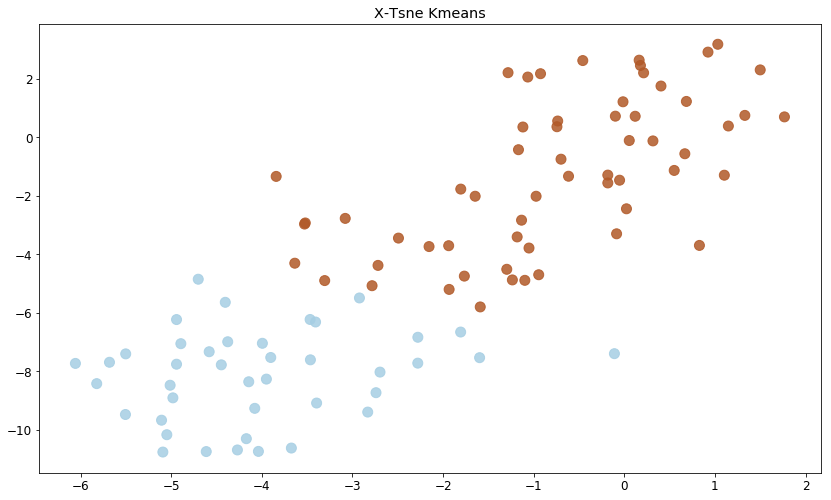

In [214]:
# Create the figure
fig = plt.figure( figsize=(14,8))
ax = fig.add_subplot(1, 1, 1, title='X-Tsne Kmeans' )
# Create the scatter
ax.scatter(
    x=Y_tsne_df['X_tsne_1'], 
    y=Y_tsne_df['X_tsne_2'], 
    c=Y_tsne_df['labels'], 
    cmap=plt.cm.get_cmap('Paired'), 
    alpha=0.85,
    s=100)

##### Adding the cluster values to the train data and use that for model building

Clustering method 1: output:

train: result_Cluster_using_doc2vec_pdf_normal_method

test: test_result_Cluster_using_doc2vec_pdf_normal_method

In [215]:
train_data = pd.concat([train_data, result_Cluster_using_doc2vec_pdf_normal_method.Cluster], axis=1)
test_data = pd.concat([test_data, test_result_Cluster_using_doc2vec_pdf_normal_method.Cluster], axis=1)

train_data.rename(columns={'Cluster': 'result_Cluster_using_doc2vec_pdf_normal_method'}, inplace=True)
test_data.rename(columns={'Cluster': 'test_result_Cluster_using_doc2vec_pdf_normal_method'}, inplace=True)

Clustering method 2: output:

train: result_cluster_using_cleaned_data

test: result_cluster_using_cleaned_data_test

In [216]:
train_data = pd.concat([train_data, result_cluster_using_cleaned_data.Cluster], axis=1)
test_data = pd.concat([test_data, result_cluster_using_cleaned_data_test.Cluster], axis=1)

train_data.rename(columns={'Cluster': 'result_cluster_using_cleaned_data'}, inplace=True)
test_data.rename(columns={'Cluster': 'result_cluster_using_cleaned_data_test'}, inplace=True)

Clustering method 3: output:

train: result_cluster_pdf_combined

test: result_cluster_pdf_combined_test

In [217]:
train_data = pd.concat([train_data, result_cluster_pdf_combined.Cluster], axis=1)
test_data = pd.concat([test_data, result_cluster_pdf_combined_test.Cluster], axis=1)

train_data.rename(columns={'Cluster': 'result_cluster_pdf_combined'}, inplace=True)
test_data.rename(columns={'Cluster': 'result_cluster_pdf_combined_test'}, inplace=True)

Clustering method 4: output:

train: result_Cluster_tfidf

test: result_Cluster_tfidf_test

In [218]:
train_data = pd.concat([train_data, result_Cluster_tfidf.Cluster], axis=1)
test_data = pd.concat([test_data, result_Cluster_tfidf_test.Cluster], axis=1)

train_data.rename(columns={'Cluster': 'result_Cluster_tfidf'}, inplace=True)
test_data.rename(columns={'Cluster': 'result_Cluster_tfidf_test'}, inplace=True)

In [219]:
train_data.head(2)

,GrievanceID,BankID,State,DateOfGrievance,Grievance_Category,GrievanceDescription,LineOfBusiness,ResolutionComments,Disputed,DateOfResolution,...,avg_word,stopwords,Special_chars,Clean_GrievanceDescription,Clean,Clean_lemmed,result_Cluster_using_doc2vec_pdf_normal_method,result_cluster_using_cleaned_data,result_cluster_pdf_combined,result_Cluster_tfidf
0,GID512411,Bank5279,State31,2016-01-19,Settlement process and costs,"Bank5279 Research dpt. \nXXXX XXXX XXXX XXXX,...",Mortgage,Closed with explanation,No,2016-01-30,...,4.601190,68,3,"Bank5279 Research dpt. \nXXXX XXXX XXXX XXXX,...",bank5279 research dpt name refinanced funded x...,bank5279 research dpt name refinanced funded x...,0,1,0,0
1,GID512415,Bank5279,State53,2016-01-19,"Loan servicing, payments, escrow account",Our Mortgage was sold to Bank5279 in XXXX of ...,Mortgage,Closed with explanation,No,2016-01-30,...,4.144876,111,0,Our Mortgage was sold to Bank5279 in XXXX of ...,sold bank5279 2014 bought missed changed carri...,sold bank5279 2014 bought missed changed carri...,0,1,0,1


In [220]:
test_data.head(2)

,GrievanceID,BankID,State,DateOfGrievance,Grievance_Category,GrievanceDescription,LineOfBusiness,ResolutionComments,Disputed,DateOfResolution,...,avg_word,stopwords,Special_chars,Clean_GrievanceDescription,Clean,Clean_lemmed,test_result_Cluster_using_doc2vec_pdf_normal_method,result_cluster_using_cleaned_data_test,result_cluster_pdf_combined_test,result_Cluster_tfidf_test
0,GID512414,Bank5334,State43,2016-01-19,"Loan servicing, payments, escrow account",I currently have a mortgage with Flag star ba...,Mortgage,Closed with explanation,No,2016-01-30,...,4.403670,52,0,I currently have a mortgage with Flag star ba...,currently flag star reaching flagstar xxxxxxxx...,currently flag star reaching flagstar xxxxxxxx...,1,1,0,0
1,GID512416,Bank5278,State16,2016-01-19,Problems when you are unable to pay,Bank5278 Auto Finance repossessed and subsequ...,Consumer Loan,Closed with explanation,No,2016-02-03,...,4.846154,28,0,Bank5278 Auto Finance repossessed and subsequ...,auto finance repossessed subsequently sold car...,auto finance repossessed subsequently sold car...,0,1,0,0


In [221]:
train_data.to_csv('../Model Building dataset/final_train_data.csv')
test_data.to_csv('../Model Building dataset/final_test_data.csv')

# Transferred the data to a csv file and then performing model building on that data.

Refer the below files.

**Model_Building_Cluster_1**

**Model_Building_Cluster_2**
      
**Model_Building_Cluster_3**
      
**Model_Building_Cluster_4**